### remember to change model saving path!!!

In [2]:
import torch
from torch.utils.data import Dataset, DataLoader
import numpy as np
from PIL import Image
import os
from torchvision import transforms
import pandas as pd
import matplotlib.pyplot as plt
import torch.optim as optim
from tqdm import tqdm
import random
import torch.nn as nn
from dataset import Thyroid_Dataset
from model import Eff_Unet
from HarDMSEG import HarDMSEG
from loss_metric import DiceLoss, IOU_score, StructureLoss, TverskyLoss
from LightMed.model.LightMed import LightMed
from PMFSNet.lib.models.PMFSNet import PMFSNet
from PMFSNet.lib.models.PMFSNet_FFT import PMFSNet_FFT
from hybrid_model_v3 import HybridSegModel
from helper import postprocess_logits_with_fill

/home/twszbak764/.local/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/twszbak764/.local/lib/python3.12/site-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/home/twszbak764/.local/lib/python3.12/site-packages/timm/models/registry.py:4: FutureWarning: Importing from timm.models.registry is deprecated, please import via timm.models
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.models", FutureWarning)


In [3]:
def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

In [4]:
import torch
from torch.utils.data import Dataset, DataLoader
import numpy as np
from PIL import Image
import os
from torchvision import transforms
import pandas as pd
import matplotlib.pyplot as plt
import torchvision.transforms.functional as tx
import random
import cv2
from PIL import ImageEnhance
from skimage.exposure import match_histograms
import torchvision.transforms as T
import torchvision.transforms.functional as F
class Ge_Benq_Dataset(Dataset):
    def __init__(self, csv_file, transform, image_size, training = True, allow_zero_mask = False):
        self.df = pd.read_csv(csv_file)
        self.transform = transform
        self.image_size = image_size
        self.training = training
        self.allow_zero_mask = allow_zero_mask
    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        image_name = self.df["image_name"][idx]
        mask_name = self.df["mask_name"][idx]
        dataset = self.df["dataset"][idx]
        mask_type = self.df["mask_type"][idx]
        
        if dataset == "ge":
            from_dataset = 1
        elif dataset == "benq":
            from_dataset = 2

        if mask_type == "nodule":
            mask_type = 1
        elif mask_type == "gland":
            mask_type = 2
        
            
        if dataset == "benq":
            from_folder = "../gland_data"
        elif dataset == "ge":
            if mask_type == 1:
                if self.training:
                    from_folder = "../ge_data/nodule/train"
                else:
                    from_folder = "../ge_data/nodule/test"
            else:
                from_folder = "../ge_data/gland"
        
        image_path = f"{from_folder}/images/{image_name}"
        mask_path = f"{from_folder}/masks/{mask_name}"

        image = Image.open(image_path).convert("L")
        mask = Image.open(mask_path).convert("L")
        
        image_tensor, mask_tensor = self.transform(image, mask, self.image_size)
        mask_tensor = (mask_tensor > 0.5).float()
        if torch.sum(mask_tensor) == 0 and self.allow_zero_mask == False:
            # print("nothing")
            return [None]
        return image_tensor, mask_tensor, from_dataset, mask_type

In [5]:
image_size = 128
batch_size = 1
def test_augmentation(image, mask, image_size):
    resize = T.Resize((image_size, image_size))
    image = resize(image)
    mask = resize(mask)

    image_tensor = tx.to_tensor(image)
    mask_tensor = tx.to_tensor(mask)

    # If standardization
    mean = image_tensor.mean()
    std = image_tensor.std()
    std = std if std > 0 else 1.0  # avoid division by zero
    image_tensor = (image_tensor - mean) / std
    return image_tensor, mask_tensor
def custom_collate_fn(batch):
    # print(batch)
    filtered_batch = [item for item in batch if item[0] is not None]
    if len(filtered_batch) == 0:
        return [None, None, None, None]
    return torch.utils.data.dataloader.default_collate(filtered_batch)

test_dataset = Ge_Benq_Dataset("../ge_benq_data/ge_benq_test_v2.csv", transform = test_augmentation, image_size = image_size, training = False)
test_dataloader = DataLoader(test_dataset, batch_size = batch_size, shuffle = False, collate_fn=custom_collate_fn)

image, mask, from_dataset, mask_type = next(iter(test_dataloader))

In [6]:
from_dataset[0]

tensor(2)

In [7]:
len(test_dataset)

229

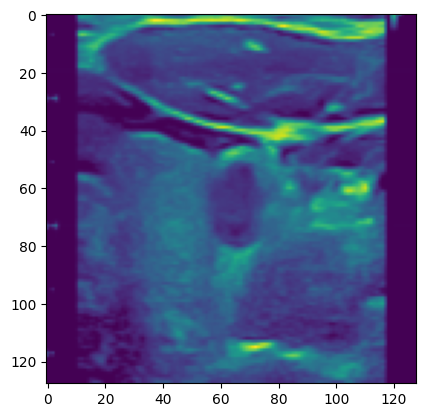

In [8]:
plt.imshow(image[0][0])

In [9]:
import torch
import numpy as np
import cv2

# Only calculate nodule loss, IOU, DICE, because there is no gland data in the testing set
def val_v1(dataloader, model, device):
    total_loss = 0
    total_IOU = 0
    total_DICE = 0

    ge_nodule_IOU = 0
    ge_gland_IOU = 0
    benq_gland_IOU = 0

    ge_nodule_DICE = 0
    ge_gland_DICE = 0
    benq_gland_DICE = 0

    ge_nodule_count = 0
    ge_gland_count = 0
    benq_gland_count = 0
    
    model.eval()
    model.to(device)

    for image, mask, from_dataset, mask_type in tqdm(dataloader):
        if image == None:
            continue
            
        image, mask = image.to(device), mask.to(device)
        
        outputs = model(image)
        nodule_output = outputs[:, 0:1, :, :]
        gland_output = outputs[:, 1:2, :, :]

        ge_nodule_output = nodule_output[(from_dataset == 1) & (mask_type == 1)]
        ge_gland_output = gland_output[(from_dataset == 1) & (mask_type == 2)]
        benq_gland_output = gland_output[(from_dataset == 2) & (mask_type == 2)]

        ge_nodule_mask = mask[(from_dataset == 1) & (mask_type == 1)]
        ge_gland_mask =mask[(from_dataset == 1) & (mask_type == 2)]
        benq_gland_mask =mask[(from_dataset == 2) & (mask_type == 2)]
        
        if from_dataset[0] == 1 and mask_type[0] == 1:
            IOU = IOU_score(ge_nodule_output, ge_nodule_mask)
            dice_loss = DiceLoss()
            DICE = 1 - dice_loss(ge_nodule_output, ge_nodule_mask)

            ge_nodule_IOU += IOU.item()
            ge_nodule_DICE += DICE.item()
            ge_nodule_count += 1
        elif from_dataset[0] == 1 and mask_type[0] == 2:
            IOU = IOU_score(ge_gland_output, ge_gland_mask)
            dice_loss = DiceLoss()
            DICE = 1 - dice_loss(ge_gland_output, ge_gland_mask)

            ge_gland_IOU += IOU.item()
            ge_gland_DICE += DICE.item()
            ge_gland_count += 1
        elif from_dataset[0] == 2 and mask_type[0] == 2:
            IOU = IOU_score(benq_gland_output, benq_gland_mask)
            dice_loss = DiceLoss()
            DICE = 1 - dice_loss(benq_gland_output, benq_gland_mask)

            benq_gland_IOU += IOU.item()
            benq_gland_DICE += DICE.item()
            benq_gland_count += 1
       


    return ge_nodule_IOU / ge_nodule_count, ge_gland_IOU / ge_gland_count, benq_gland_IOU / benq_gland_count, ge_nodule_DICE / ge_nodule_count, ge_gland_DICE / ge_gland_count, benq_gland_DICE / benq_gland_count

def val_v2(dataloader, model, device, gland_post_process = False, nodule_post_process = False):
    total_loss = 0
    total_IOU = 0
    total_DICE = 0

    ge_nodule_IOU = 0
    ge_gland_IOU = 0
    benq_gland_IOU = 0

    ge_nodule_DICE = 0
    ge_gland_DICE = 0
    benq_gland_DICE = 0

    ge_nodule_count = 0
    ge_gland_count = 0
    benq_gland_count = 0
    
    model.eval()
    model.to(device)

    for image, mask, from_dataset, mask_type in tqdm(dataloader):
        if image == None:
            continue
            
        image, mask = image.to(device), mask.to(device)
        
        outputs = model(image)
        nodule_output = outputs[:, 0:1, :, :]
        gland_output = outputs[:, 1:2, :, :]

        ge_nodule_output = nodule_output
        ge_gland_output = gland_output
        benq_gland_output = gland_output

        ge_nodule_mask = mask
        ge_gland_mask = mask
        benq_gland_mask = mask

        if gland_post_process:
            ge_gland_output = postprocess_logits_with_fill(ge_gland_output)
            benq_gland_output = postprocess_logits_with_fill(benq_gland_output)
        if nodule_post_process:
            ge_nodule_output = postprocess_logits_with_fill(ge_nodule_output)
            # ge_nodule_output = torch.sigmoid(ge_nodule_output)
            # ge_nodule_output = ge_nodule_output > 0.5
            # ge_nodule_output = ge_nodule_output * ge_gland_output
        
        if from_dataset[0] == 1 and mask_type[0] == 1:
            if nodule_post_process:
                IOU = IOU_score(ge_nodule_output, ge_nodule_mask, need_act = False)
                dice_loss = DiceLoss(need_act = False)
                DICE = 1 - dice_loss(ge_nodule_output, ge_nodule_mask)
            else:
                IOU = IOU_score(ge_nodule_output, ge_nodule_mask)
                dice_loss = DiceLoss()
                DICE = 1 - dice_loss(ge_nodule_output, ge_nodule_mask)

            ge_nodule_IOU += IOU.item()
            ge_nodule_DICE += DICE.item()
            ge_nodule_count += 1
        elif from_dataset[0] == 1 and mask_type[0] == 2:
            if gland_post_process:
                IOU = IOU_score(ge_gland_output, ge_gland_mask, need_act = False)
                dice_loss = DiceLoss(need_act = False)
                DICE = 1 - dice_loss(ge_gland_output, ge_gland_mask)
            else:
                IOU = IOU_score(ge_gland_output, ge_gland_mask)
                dice_loss = DiceLoss()
                DICE = 1 - dice_loss(ge_gland_output, ge_gland_mask)

            ge_gland_IOU += IOU.item()
            ge_gland_DICE += DICE.item()
            ge_gland_count += 1
        elif from_dataset[0] == 2 and mask_type[0] == 2:
            if gland_post_process:
                IOU = IOU_score(benq_gland_output, benq_gland_mask, need_act = False)
                dice_loss = DiceLoss(need_act = False)
                DICE = 1 - dice_loss(benq_gland_output, benq_gland_mask)
            else:
                IOU = IOU_score(benq_gland_output, benq_gland_mask)
                dice_loss = DiceLoss()
                DICE = 1 - dice_loss(benq_gland_output, benq_gland_mask)

            benq_gland_IOU += IOU.item()
            benq_gland_DICE += DICE.item()
            benq_gland_count += 1
       


    return ge_nodule_IOU / ge_nodule_count, ge_gland_IOU / ge_gland_count, benq_gland_IOU / benq_gland_count, ge_nodule_DICE / ge_nodule_count, ge_gland_DICE / ge_gland_count, benq_gland_DICE / benq_gland_count

    

In [29]:

# inference_name = "hybrid_model_ge(nodule_gland_inference_v2)_benq(crop_gland)_baseline(1)_freeze_encoder_aug_space"
inference_name = "test"
model = HybridSegModel(in_channels = 1, out_channels = 2, output_size = image_size, layers_num = 3)
checkpoint = torch.load(f"models/finetune/ge_benq/{inference_name}/best_checkpoint.pth")
model.load_state_dict(checkpoint['model_state_dict'])


<All keys matched successfully>

In [30]:
ge_nodule_IOU, ge_gland_IOU, benq_gland_IOU, ge_nodule_DICE, ge_gland_DICE, benq_gland_DICE = val_v1(test_dataloader, model, "cuda")
print(f"ge nodule IOU : {ge_nodule_IOU}, ge nodule DICE : {ge_nodule_DICE}")
print(f"ge gland IOU : {ge_gland_IOU}, ge gland DICE : {ge_gland_DICE}")
print(f"benq gland IOU : {benq_gland_IOU}, ge gland DICE : {benq_gland_DICE}")


100%|██████████| 229/229 [00:04<00:00, 47.88it/s]

ge nodule IOU : 0.7220571569550558, ge nodule DICE : 0.8075766752261927
ge gland IOU : 0.7314090242511347, ge gland DICE : 0.8236470222473145
benq gland IOU : 0.7716868681422735, ge gland DICE : 0.8433225468053656


In [31]:
ge_nodule_IOU, ge_gland_IOU, benq_gland_IOU, ge_nodule_DICE, ge_gland_DICE, benq_gland_DICE = val_v2(test_dataloader, model, "cuda", gland_post_process = True, nodule_post_process = True)
print(f"ge nodule IOU : {ge_nodule_IOU}, ge nodule DICE : {ge_nodule_DICE}")
print(f"ge gland IOU : {ge_gland_IOU}, ge gland DICE : {ge_gland_DICE}")
print(f"benq gland IOU : {benq_gland_IOU}, ge gland DICE : {benq_gland_DICE}")


100%|██████████| 229/229 [00:05<00:00, 41.76it/s]

ge nodule IOU : 0.7364161969380648, ge nodule DICE : 0.8294247778335421
ge gland IOU : 0.7418114746871748, ge gland DICE : 0.8486583640700892
benq gland IOU : 0.7892686411485834, ge gland DICE : 0.8803394386323832


# visualize ge nodule non-zero mask

  0%|          | 1/229 [00:01<05:05,  1.34s/it]

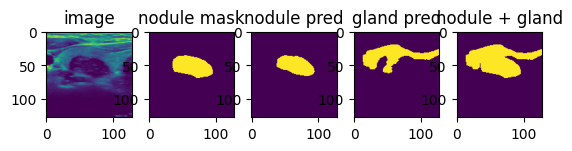

  1%|▏         | 3/229 [00:02<02:53,  1.30it/s]

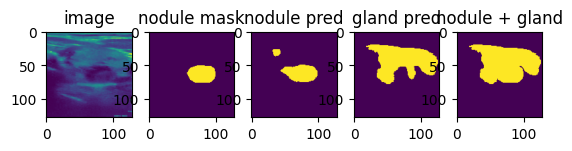

  3%|▎         | 6/229 [00:03<01:57,  1.90it/s]

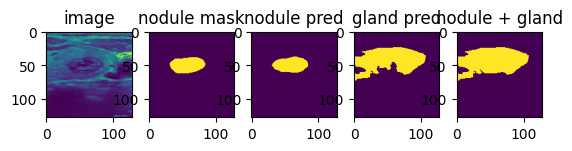

  3%|▎         | 8/229 [00:04<01:53,  1.95it/s]

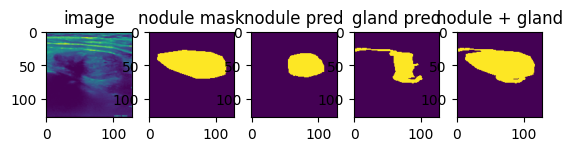

  4%|▍         | 9/229 [00:05<02:41,  1.37it/s]

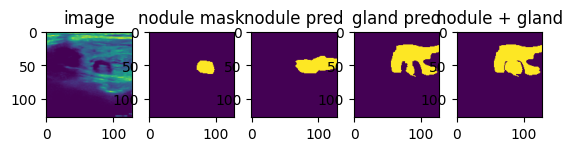

  8%|▊         | 18/229 [00:07<01:01,  3.40it/s]

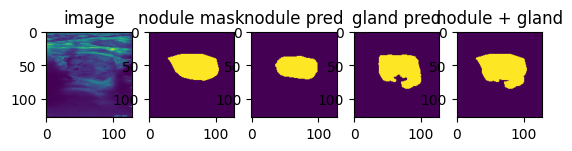

  9%|▊         | 20/229 [00:08<01:12,  2.87it/s]

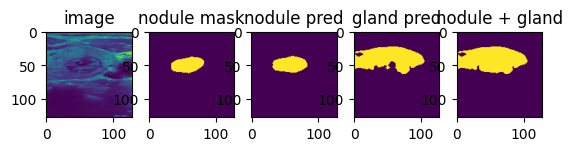

  9%|▉         | 21/229 [00:08<01:11,  2.92it/s]

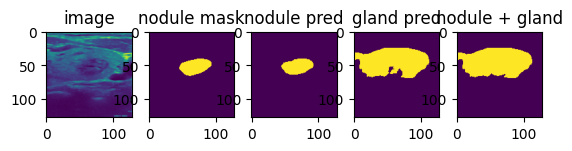

 11%|█         | 25/229 [00:11<01:40,  2.04it/s]

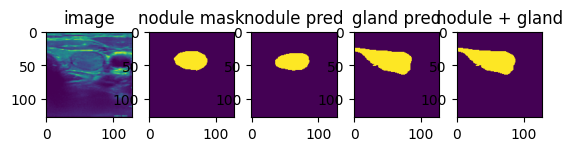

 11%|█▏        | 26/229 [00:12<01:53,  1.78it/s]

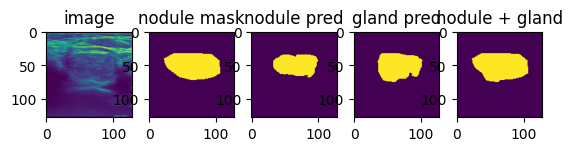

 12%|█▏        | 28/229 [00:12<01:25,  2.36it/s]

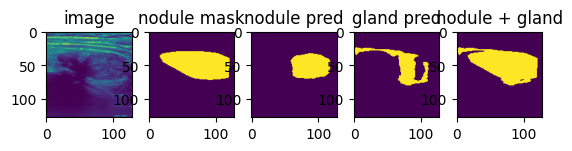

 13%|█▎        | 29/229 [00:13<01:20,  2.49it/s]

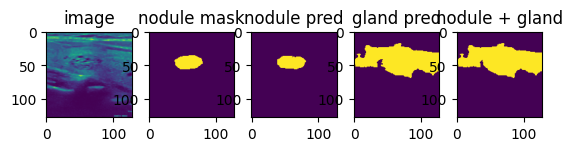

 13%|█▎        | 30/229 [00:13<01:16,  2.61it/s]

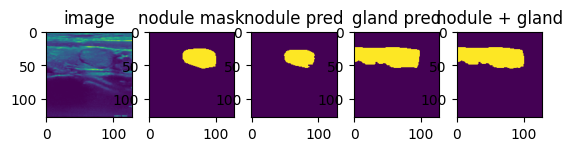

 14%|█▍        | 32/229 [00:15<01:59,  1.65it/s]

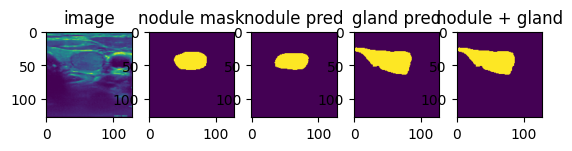

 15%|█▍        | 34/229 [00:15<01:24,  2.31it/s]

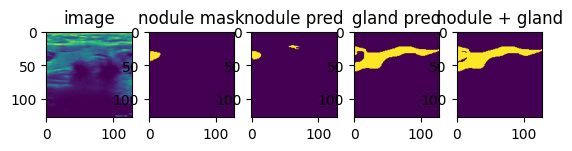

 15%|█▌        | 35/229 [00:16<01:18,  2.47it/s]

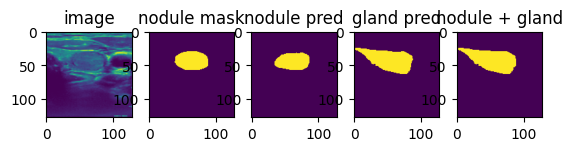

 16%|█▌        | 36/229 [00:16<01:13,  2.63it/s]

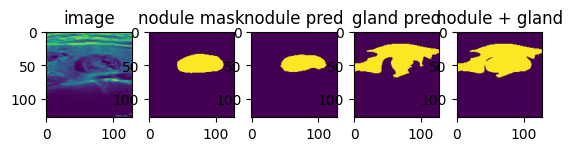

 17%|█▋        | 38/229 [00:18<01:57,  1.62it/s]

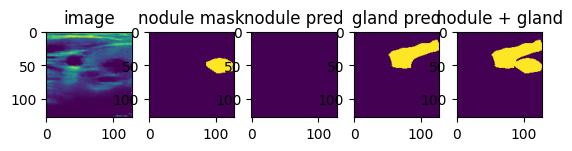

 18%|█▊        | 41/229 [00:19<01:29,  2.10it/s]

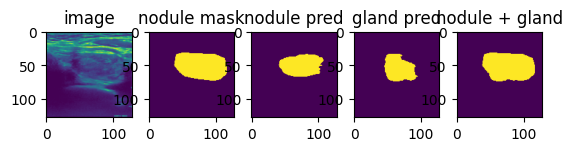

 18%|█▊        | 42/229 [00:19<01:22,  2.27it/s]

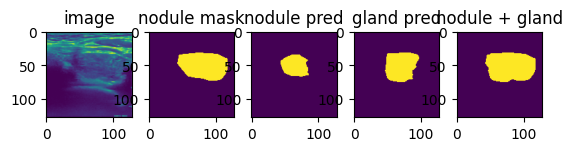

 19%|█▉        | 44/229 [00:21<02:05,  1.47it/s]

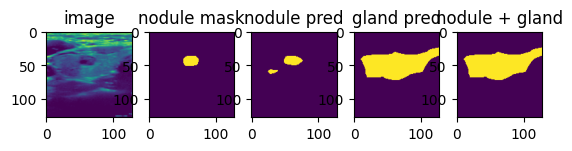

 21%|██        | 48/229 [00:22<01:13,  2.47it/s]

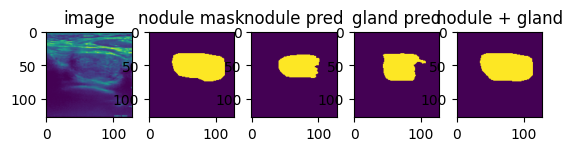

 21%|██▏       | 49/229 [00:23<01:10,  2.54it/s]

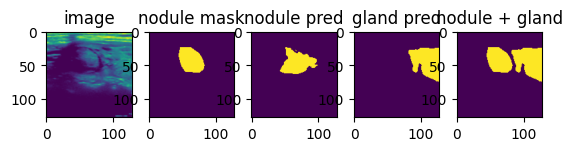

 22%|██▏       | 51/229 [00:24<01:42,  1.73it/s]

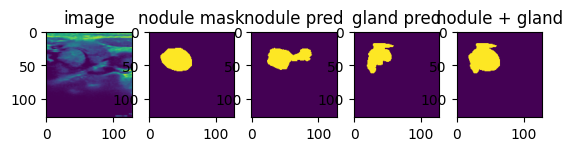

 23%|██▎       | 53/229 [00:25<01:34,  1.87it/s]

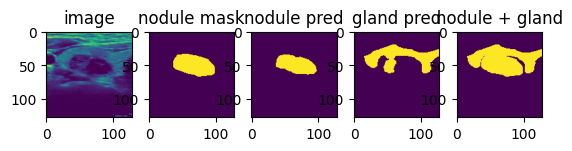

 24%|██▎       | 54/229 [00:26<01:24,  2.07it/s]

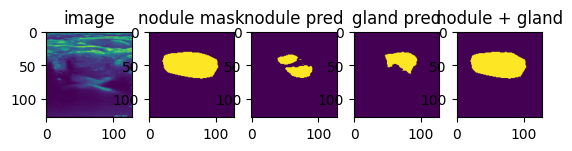

 24%|██▍       | 55/229 [00:26<01:41,  1.72it/s]

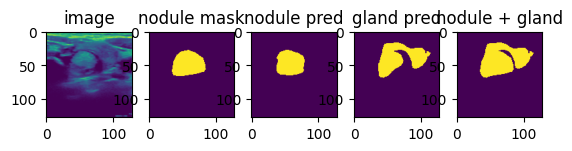

 25%|██▍       | 57/229 [00:27<01:09,  2.47it/s]

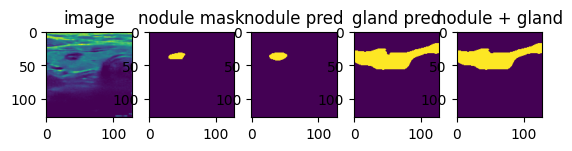

 25%|██▌       | 58/229 [00:27<01:06,  2.59it/s]

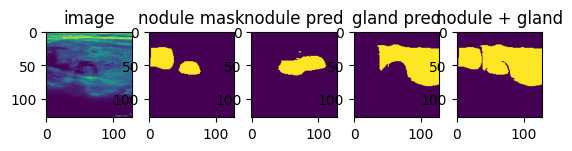

 27%|██▋       | 61/229 [00:28<00:53,  3.17it/s]

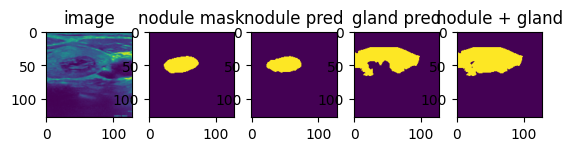

 27%|██▋       | 62/229 [00:29<01:14,  2.25it/s]

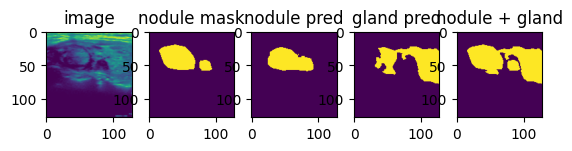

 29%|██▉       | 67/229 [00:29<00:36,  4.49it/s]

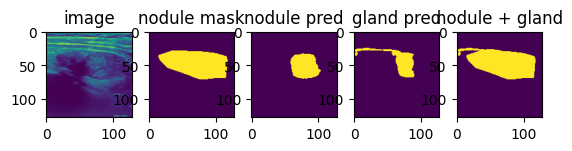

 31%|███       | 70/229 [00:31<00:52,  3.01it/s]

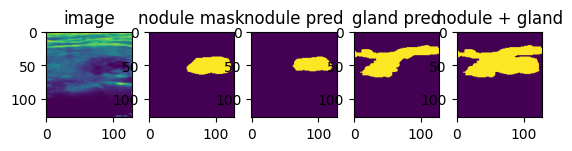

 31%|███       | 71/229 [00:31<00:52,  3.02it/s]

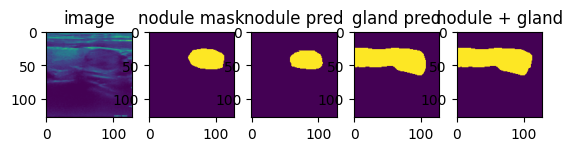

 31%|███▏      | 72/229 [00:31<00:51,  3.03it/s]

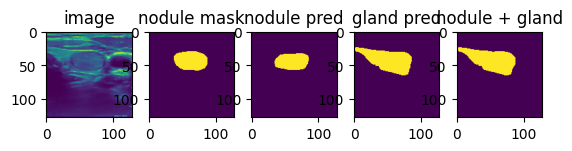

 34%|███▎      | 77/229 [00:33<00:49,  3.05it/s]

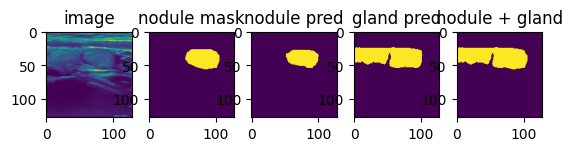

 34%|███▍      | 79/229 [00:34<00:57,  2.60it/s]

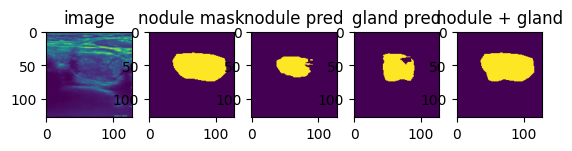

 36%|███▌      | 82/229 [00:35<00:47,  3.12it/s]

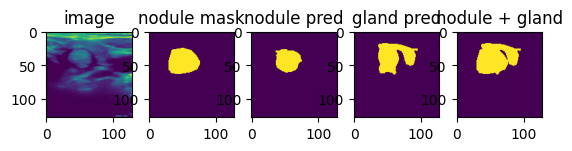

 38%|███▊      | 88/229 [00:38<00:50,  2.78it/s]

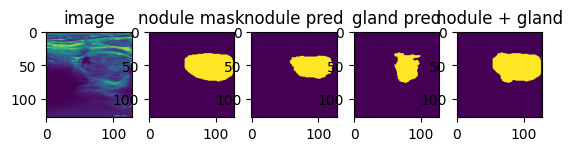

 40%|███▉      | 91/229 [00:39<01:01,  2.25it/s]

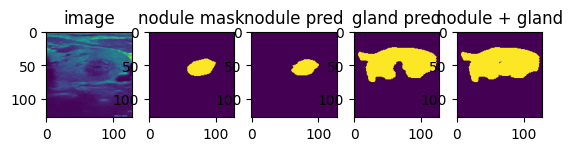

 41%|████      | 94/229 [00:41<01:09,  1.94it/s]

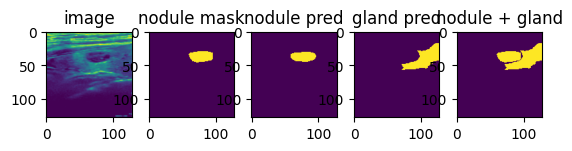

 41%|████▏     | 95/229 [00:41<01:02,  2.14it/s]

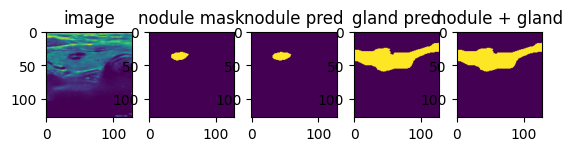

 43%|████▎     | 98/229 [00:43<01:11,  1.84it/s]

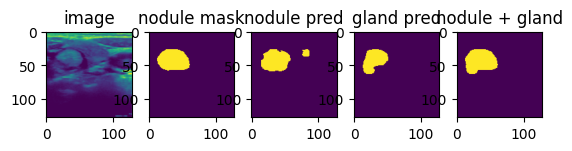

 43%|████▎     | 99/229 [00:43<01:03,  2.04it/s]

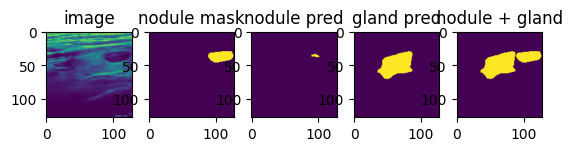

 44%|████▍     | 101/229 [00:44<00:47,  2.71it/s]

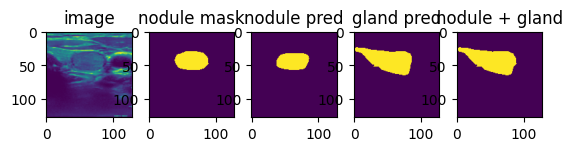

 45%|████▍     | 102/229 [00:44<01:02,  2.04it/s]

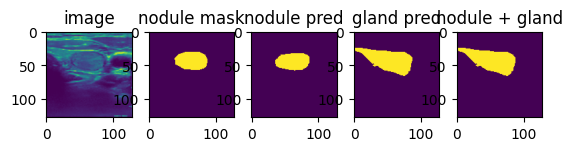

 47%|████▋     | 107/229 [00:45<00:28,  4.35it/s]

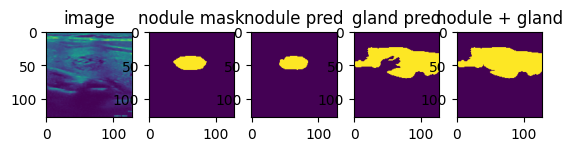

 48%|████▊     | 109/229 [00:45<00:25,  4.70it/s]

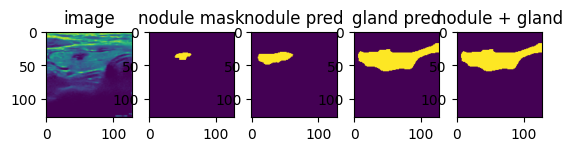

 48%|████▊     | 111/229 [00:47<00:37,  3.11it/s]

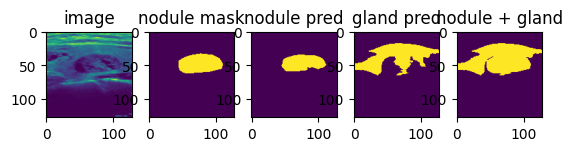

 49%|████▉     | 112/229 [00:49<01:11,  1.63it/s]

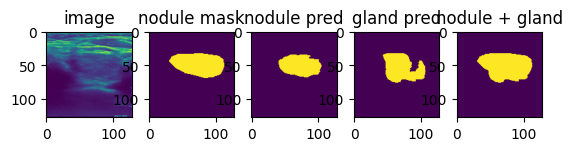

 50%|█████     | 115/229 [00:50<01:05,  1.75it/s]

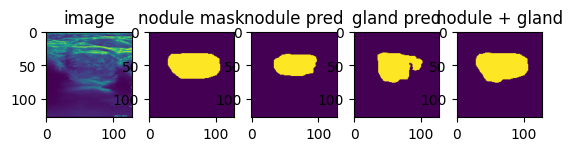

 51%|█████     | 116/229 [00:52<01:27,  1.29it/s]

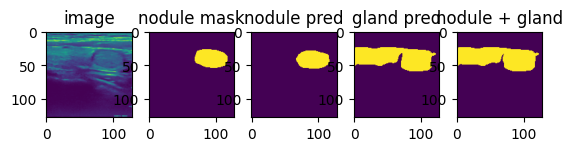

 51%|█████     | 117/229 [00:53<01:35,  1.17it/s]

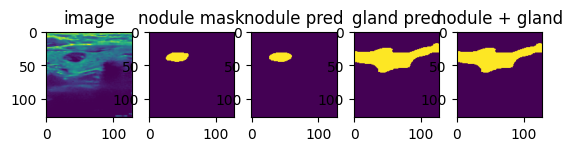

 55%|█████▍    | 125/229 [00:56<01:01,  1.68it/s]

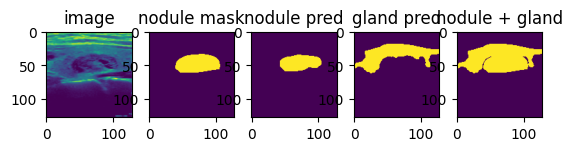

 55%|█████▌    | 126/229 [00:57<00:55,  1.87it/s]

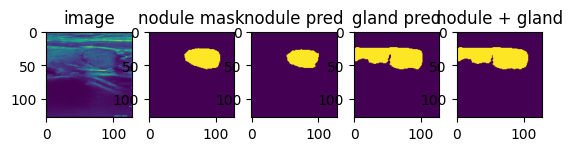

 58%|█████▊    | 132/229 [00:59<00:49,  1.97it/s]

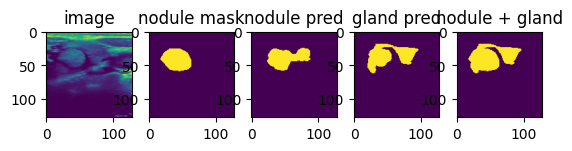

 58%|█████▊    | 133/229 [01:00<01:01,  1.57it/s]

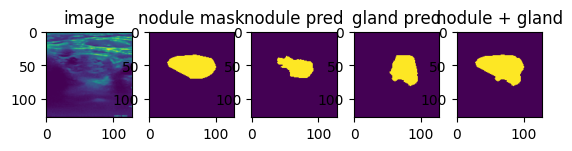

 59%|█████▉    | 136/229 [01:01<00:43,  2.14it/s]

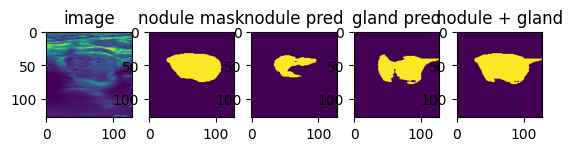

 60%|█████▉    | 137/229 [01:02<00:39,  2.31it/s]

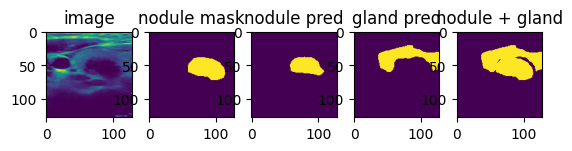

 60%|██████    | 138/229 [01:02<00:36,  2.47it/s]

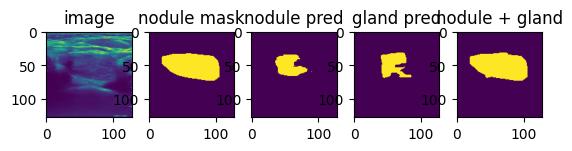

 61%|██████    | 139/229 [01:02<00:34,  2.61it/s]

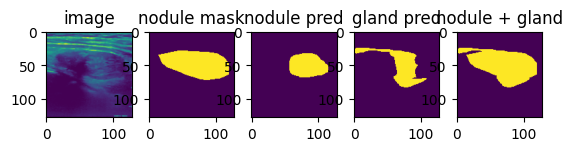

 62%|██████▏   | 143/229 [01:04<00:30,  2.83it/s]

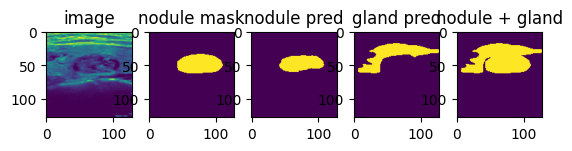

 63%|██████▎   | 145/229 [01:04<00:24,  3.43it/s]

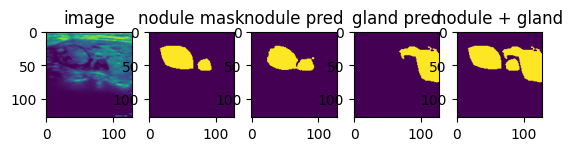

 65%|██████▍   | 148/229 [01:05<00:26,  3.03it/s]

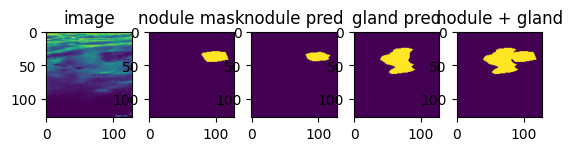

 65%|██████▌   | 149/229 [01:06<00:26,  3.02it/s]

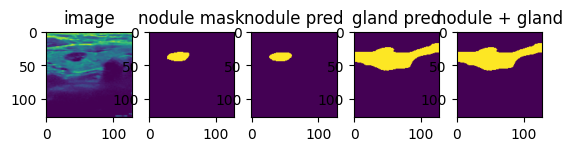

 66%|██████▌   | 150/229 [01:06<00:25,  3.05it/s]

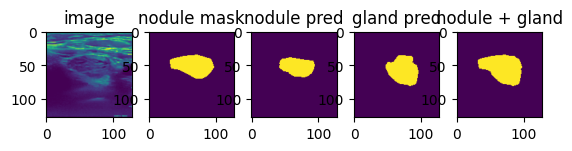

 66%|██████▋   | 152/229 [01:07<00:21,  3.60it/s]

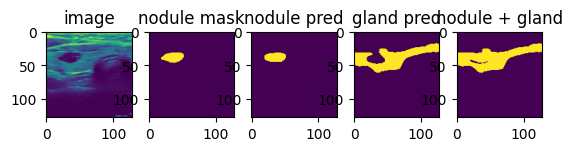

 67%|██████▋   | 154/229 [01:07<00:21,  3.49it/s]

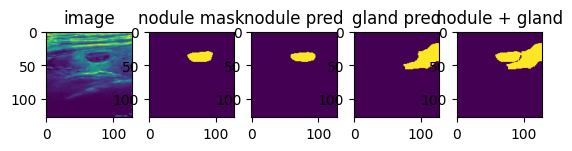

 68%|██████▊   | 155/229 [01:07<00:21,  3.40it/s]

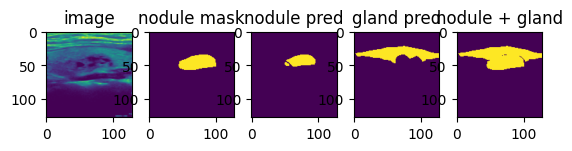

 69%|██████▊   | 157/229 [01:08<00:18,  3.87it/s]

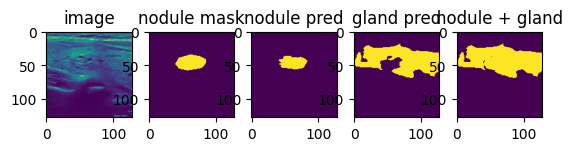

 69%|██████▉   | 159/229 [01:09<00:22,  3.08it/s]

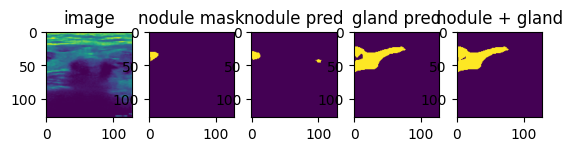

 71%|███████   | 162/229 [01:11<00:32,  2.05it/s]

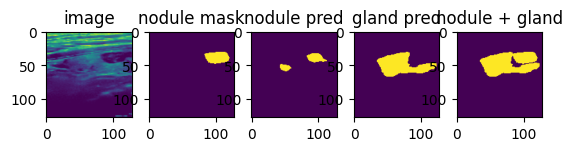

 72%|███████▏  | 164/229 [01:11<00:24,  2.62it/s]

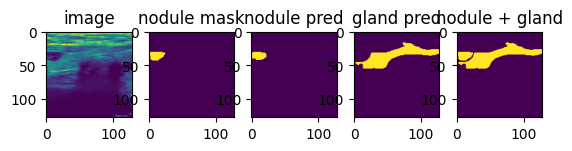

 72%|███████▏  | 165/229 [01:11<00:24,  2.63it/s]

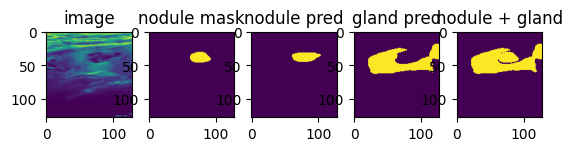

 72%|███████▏  | 166/229 [01:13<00:38,  1.62it/s]

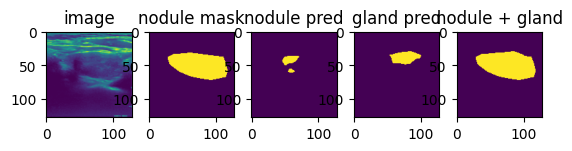

 75%|███████▍  | 171/229 [01:14<00:17,  3.25it/s]

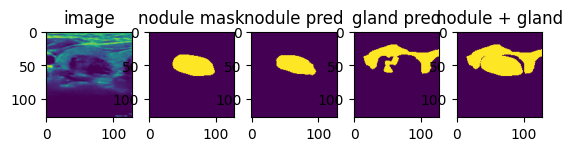

 76%|███████▌  | 173/229 [01:14<00:19,  2.94it/s]

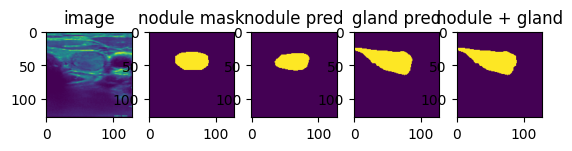

 76%|███████▌  | 174/229 [01:15<00:18,  2.95it/s]

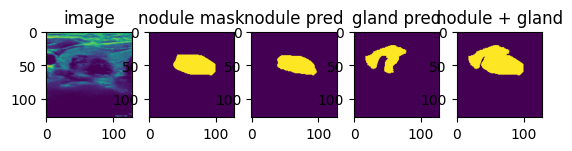

 76%|███████▋  | 175/229 [01:15<00:17,  3.01it/s]

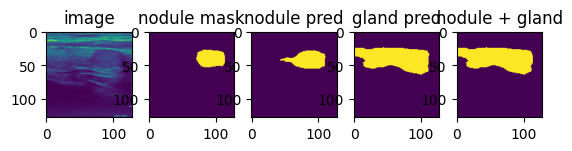

 79%|███████▉  | 181/229 [01:17<00:19,  2.47it/s]

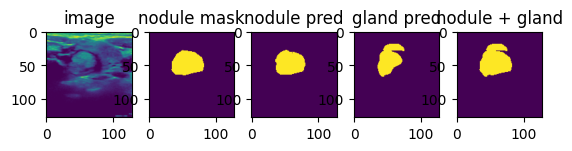

 79%|███████▉  | 182/229 [01:17<00:18,  2.56it/s]

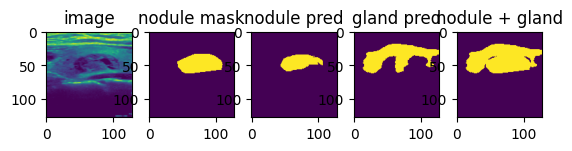

 80%|████████  | 184/229 [01:18<00:14,  3.11it/s]

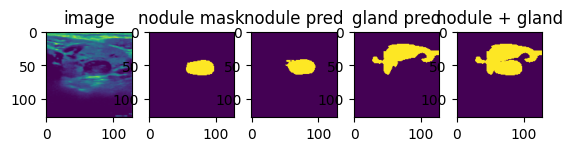

 82%|████████▏ | 187/229 [01:18<00:11,  3.80it/s]

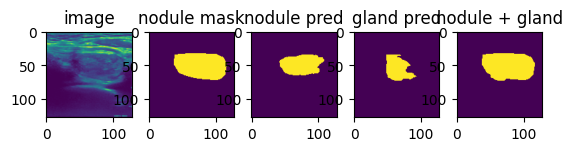

 83%|████████▎ | 189/229 [01:19<00:09,  4.10it/s]

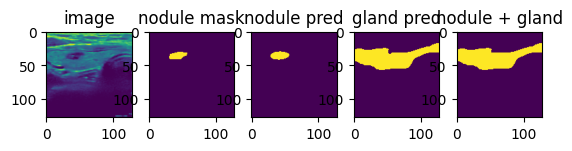

 83%|████████▎ | 190/229 [01:19<00:12,  3.08it/s]

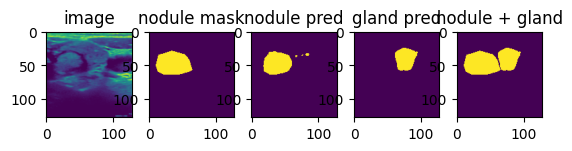

 83%|████████▎ | 191/229 [01:20<00:16,  2.24it/s]

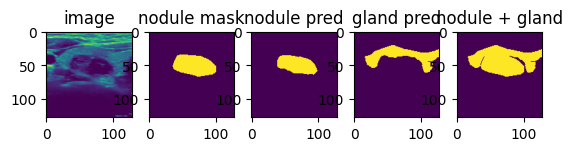

 84%|████████▍ | 192/229 [01:21<00:15,  2.41it/s]

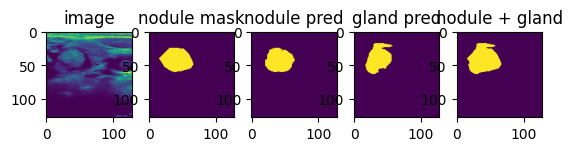

 84%|████████▍ | 193/229 [01:21<00:14,  2.56it/s]

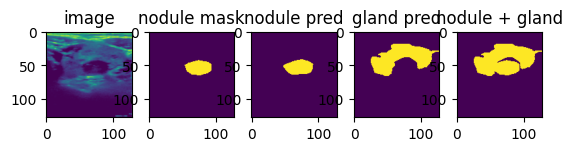

 85%|████████▌ | 195/229 [01:22<00:11,  2.94it/s]

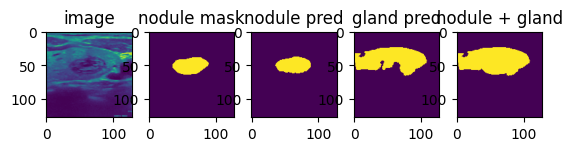

 86%|████████▌ | 197/229 [01:22<00:09,  3.42it/s]

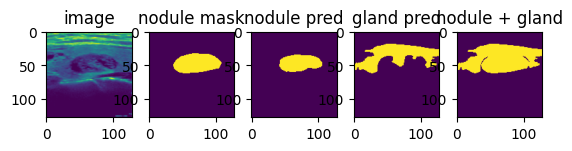

 87%|████████▋ | 200/229 [01:23<00:08,  3.52it/s]

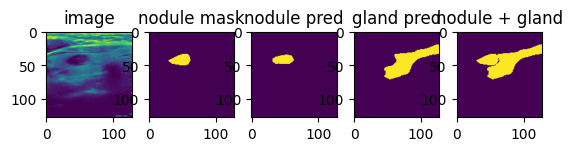

 88%|████████▊ | 201/229 [01:23<00:08,  3.39it/s]

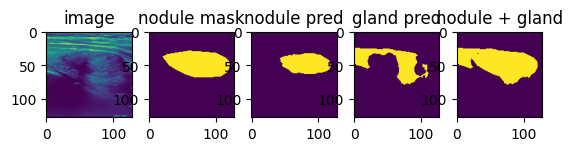

 92%|█████████▏| 210/229 [01:25<00:04,  4.63it/s]

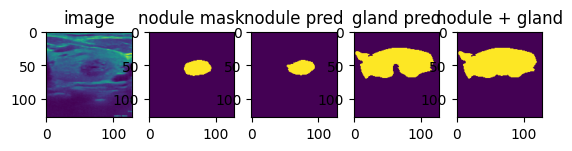

 93%|█████████▎| 212/229 [01:26<00:06,  2.79it/s]

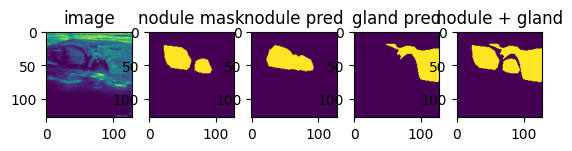

 93%|█████████▎| 213/229 [01:27<00:05,  2.83it/s]

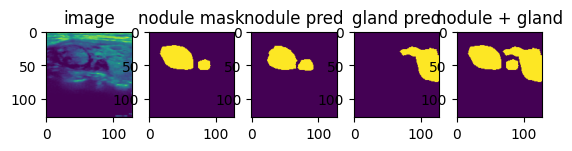

 95%|█████████▍| 217/229 [01:30<00:06,  1.87it/s]

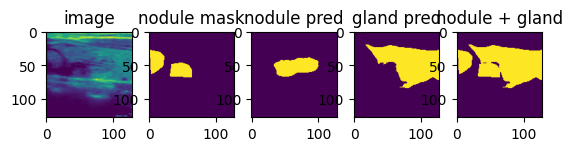

 97%|█████████▋| 222/229 [01:31<00:02,  3.32it/s]

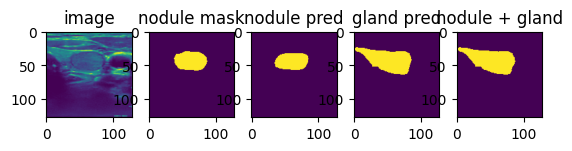

 97%|█████████▋| 223/229 [01:31<00:02,  2.92it/s]

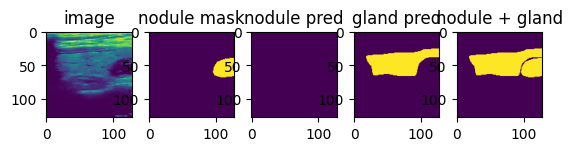

 98%|█████████▊| 224/229 [01:32<00:02,  2.49it/s]

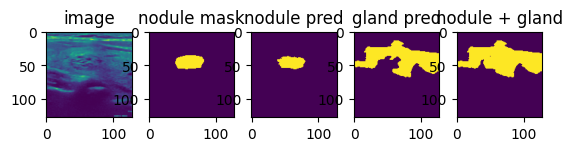

 99%|█████████▊| 226/229 [01:32<00:00,  3.03it/s]

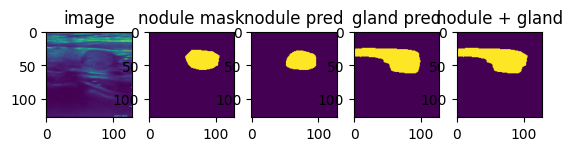

100%|█████████▉| 228/229 [01:35<00:00,  1.52it/s]

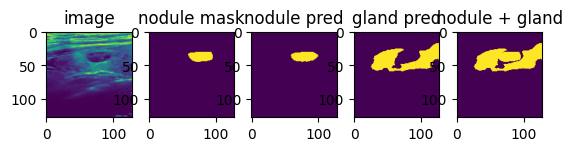

100%|██████████| 229/229 [01:35<00:00,  2.40it/s]


In [32]:
test_dataset = Ge_Benq_Dataset("../ge_benq_data/ge_benq_test_v2.csv", transform = test_augmentation, image_size = image_size, training = False, allow_zero_mask = False)
test_dataloader = DataLoader(test_dataset, batch_size = batch_size, shuffle = False, collate_fn=custom_collate_fn)
model.to("cpu")
for image, mask, from_dataset, mask_type in tqdm(test_dataloader):
    if image != None:
        outputs = model(image)
        if from_dataset[0] == 1 and mask_type[0]==1:
            nodule_output = outputs[:, 0:1, :, :]
            gland_output = outputs[:, 1:2, :, :]
            
            nodule_output = torch.sigmoid(nodule_output)
            nodule_output = nodule_output > 0.9

            gland_output = postprocess_logits_with_fill(gland_output)
            gland_output = gland_output > 0.5
            mask = mask > 0.5
            
            nodule_gland = (mask[0][0] | gland_output[0][0])
            
            plt.subplot(1,5,1)
            plt.imshow(image[0][0])
            plt.title("image")
            plt.subplot(1,5,2)
            plt.imshow(mask[0][0])
            plt.title("nodule mask")
            plt.subplot(1,5,3)
            plt.imshow(nodule_output[0][0].detach().numpy())
            plt.title("nodule pred")
            plt.subplot(1,5,4)
            plt.imshow(gland_output[0][0].detach().numpy())
            plt.title("gland pred")
            plt.subplot(1,5,5)
            plt.imshow(nodule_gland.detach().numpy())
            plt.title("nodule + gland")
            plt.show()

# visualize ge gland non zero mask

  0%|          | 1/229 [00:00<01:35,  2.38it/s]

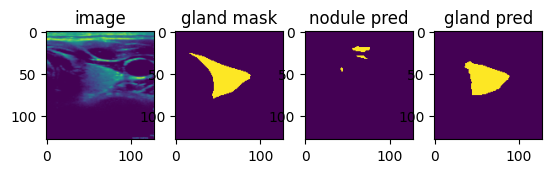

  2%|▏         | 5/229 [00:01<01:01,  3.62it/s]

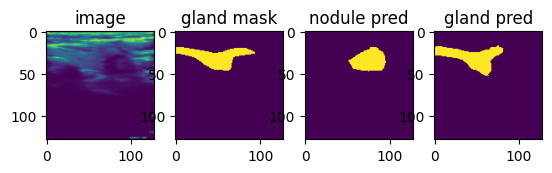

  5%|▌         | 12/229 [00:06<01:58,  1.82it/s]

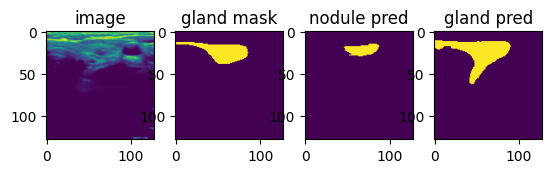

  6%|▌         | 13/229 [00:06<02:06,  1.70it/s]

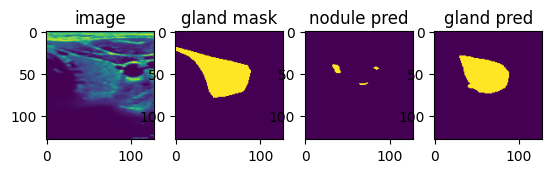

  6%|▌         | 14/229 [00:09<03:55,  1.09s/it]

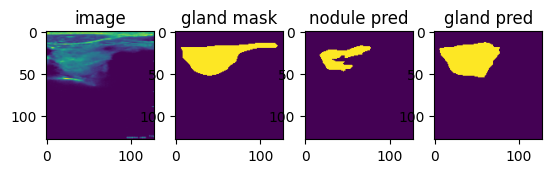

  7%|▋         | 15/229 [00:10<03:29,  1.02it/s]

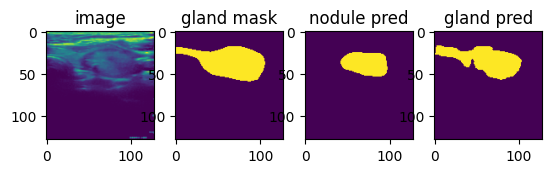

  8%|▊         | 19/229 [00:11<02:01,  1.73it/s]

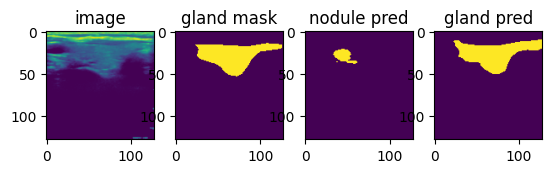

 10%|▉         | 22/229 [00:13<02:04,  1.66it/s]

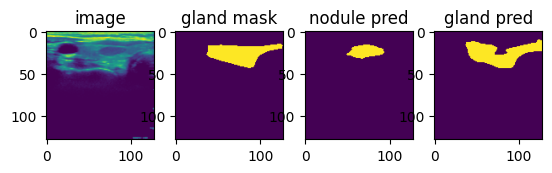

 10%|█         | 23/229 [00:14<02:52,  1.19it/s]

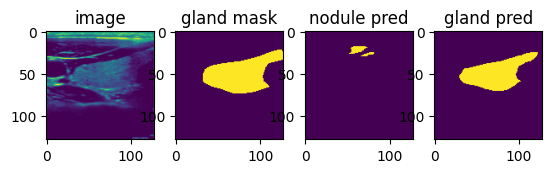

 11%|█▏        | 26/229 [00:16<02:19,  1.45it/s]

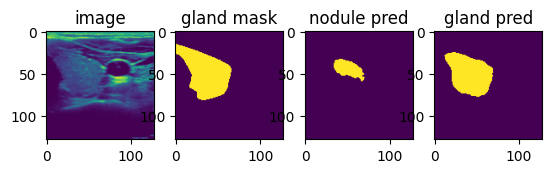

 13%|█▎        | 30/229 [00:18<01:40,  1.97it/s]

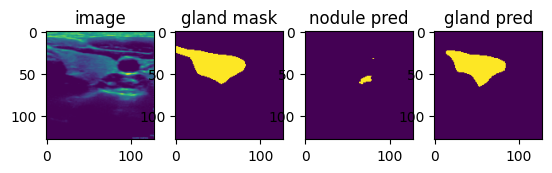

 14%|█▍        | 32/229 [00:19<01:37,  2.02it/s]

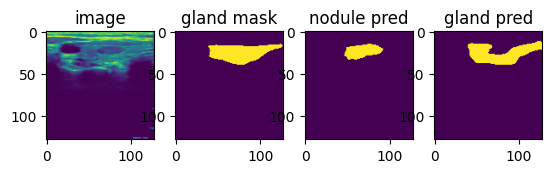

 16%|█▌        | 36/229 [00:21<01:17,  2.49it/s]

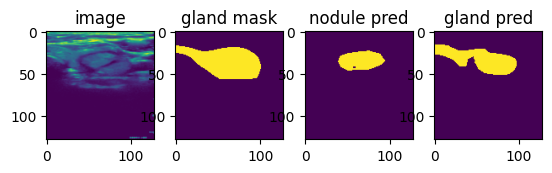

 17%|█▋        | 39/229 [00:23<01:40,  1.90it/s]

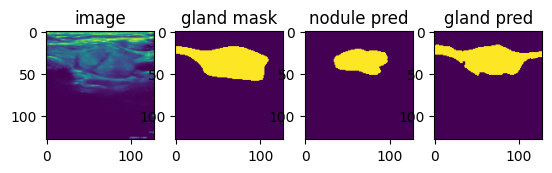

 20%|██        | 46/229 [00:26<01:02,  2.92it/s]

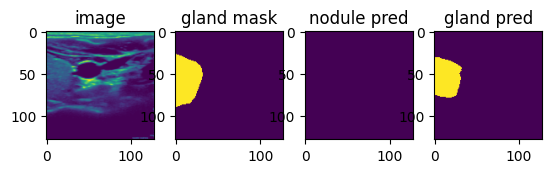

 26%|██▌       | 60/229 [00:31<01:10,  2.41it/s]

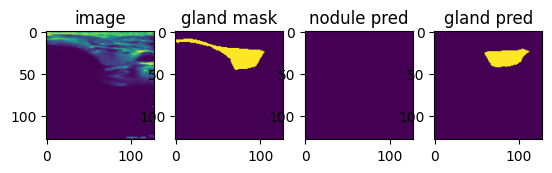

 27%|██▋       | 62/229 [00:32<01:18,  2.14it/s]

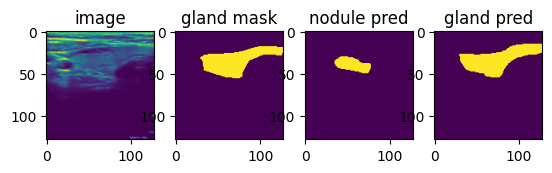

 28%|██▊       | 65/229 [00:33<01:01,  2.68it/s]

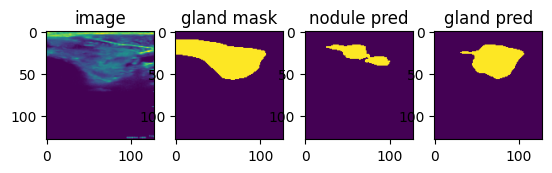

 32%|███▏      | 74/229 [00:33<00:21,  7.32it/s]

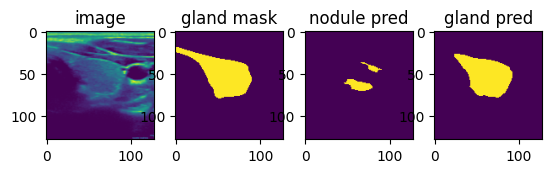

 33%|███▎      | 76/229 [00:34<00:21,  7.16it/s]

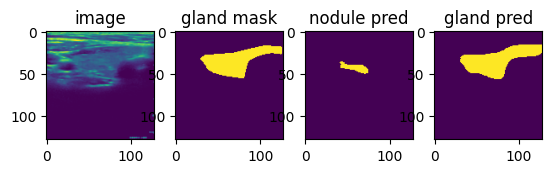

 35%|███▍      | 80/229 [00:34<00:17,  8.53it/s]

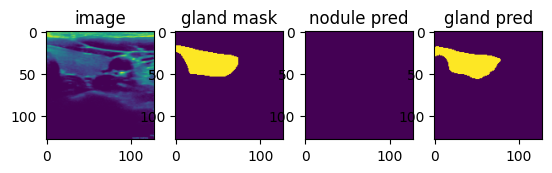

 37%|███▋      | 85/229 [00:37<00:44,  3.20it/s]

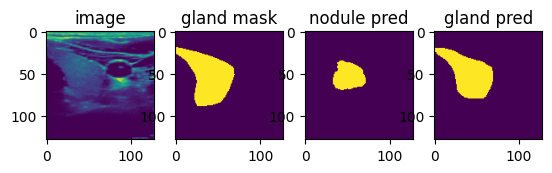

 39%|███▉      | 89/229 [00:37<00:29,  4.80it/s]

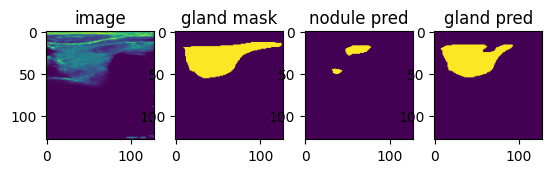

 61%|██████    | 140/229 [00:49<00:28,  3.15it/s]

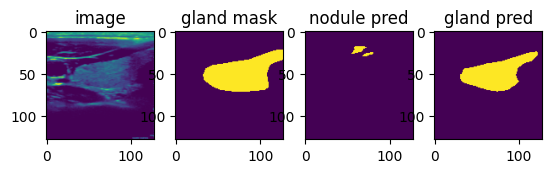

 62%|██████▏   | 141/229 [00:49<00:28,  3.09it/s]

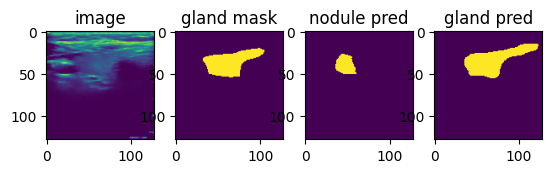

 66%|██████▌   | 150/229 [00:52<00:26,  3.02it/s]

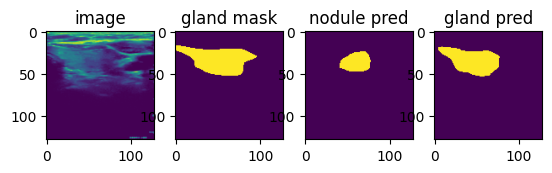

 70%|███████   | 161/229 [00:56<00:18,  3.60it/s]

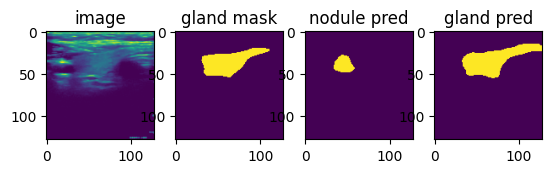

 74%|███████▍  | 169/229 [00:59<00:26,  2.28it/s]

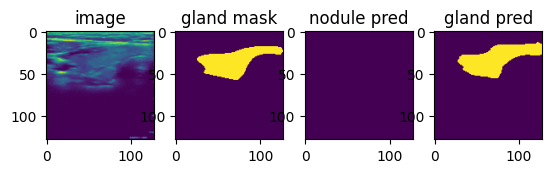

 74%|███████▍  | 170/229 [01:00<00:24,  2.42it/s]

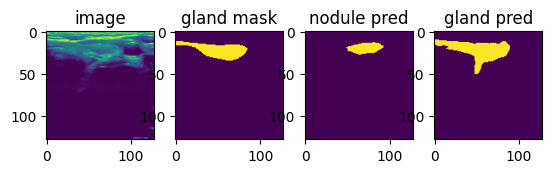

 77%|███████▋  | 177/229 [01:01<00:09,  5.36it/s]

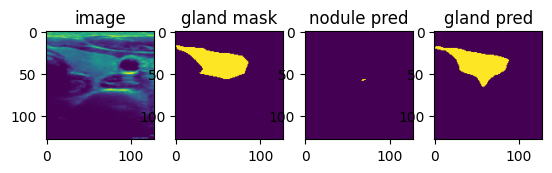

 79%|███████▉  | 182/229 [01:02<00:14,  3.32it/s]

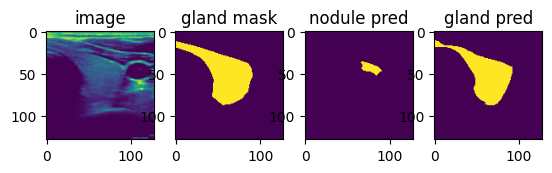

 81%|████████  | 186/229 [01:03<00:09,  4.38it/s]

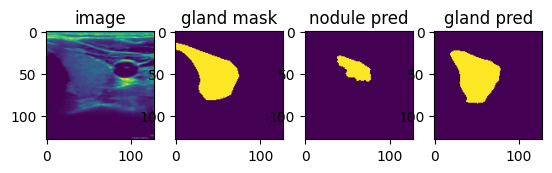

 82%|████████▏ | 187/229 [01:05<00:21,  1.99it/s]

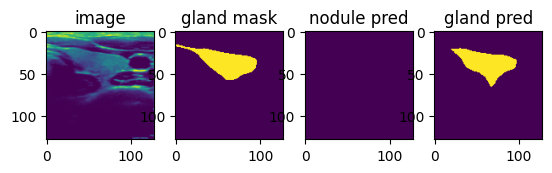

 86%|████████▋ | 198/229 [01:10<00:15,  2.06it/s]

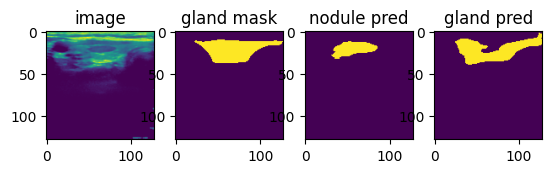

 87%|████████▋ | 199/229 [01:10<00:13,  2.28it/s]

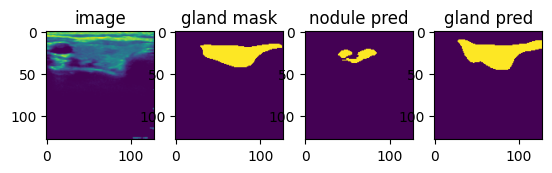

 88%|████████▊ | 201/229 [01:11<00:10,  2.59it/s]

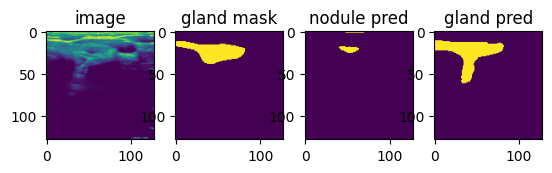

 91%|█████████ | 208/229 [01:12<00:06,  3.44it/s]

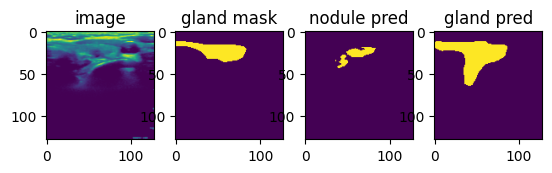

 95%|█████████▌| 218/229 [01:15<00:02,  4.17it/s]

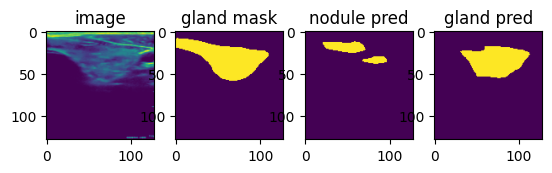

100%|██████████| 229/229 [01:17<00:00,  2.97it/s]


In [35]:
test_dataset = Ge_Benq_Dataset("../ge_benq_data/ge_benq_test_v2.csv", transform = test_augmentation, image_size = image_size, training = False, allow_zero_mask = False)
test_dataloader = DataLoader(test_dataset, batch_size = batch_size, shuffle = False, collate_fn=custom_collate_fn)
model.to("cpu")
for image, mask, from_dataset, mask_type in tqdm(test_dataloader):
    if image != None:
        outputs = model(image)
        if from_dataset[0] == 1 and mask_type[0]==2:
            nodule_output = outputs[:, 0:1, :, :]
            gland_output = outputs[:, 1:2, :, :]
            
            nodule_output = torch.sigmoid(nodule_output)
            nodule_output = nodule_output > 0.5

            gland_output = postprocess_logits_with_fill(gland_output)
            
            plt.subplot(1,4,1)
            plt.imshow(image[0][0])
            plt.title("image")
            plt.subplot(1,4,2)
            plt.imshow(mask[0][0])
            plt.title("gland mask")
            plt.subplot(1,4,3)
            plt.imshow(nodule_output[0][0].detach().numpy())
            plt.title("nodule pred")
            plt.subplot(1,4,4)
            plt.imshow(gland_output[0][0].detach().numpy())
            plt.title("gland pred")
            plt.show()

# visualize benq gland non-zero mask

  0%|          | 0/229 [00:00<?, ?it/s]

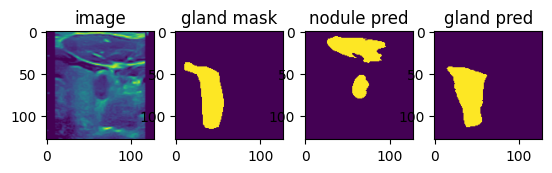

  3%|▎         | 6/229 [00:00<00:32,  6.79it/s]

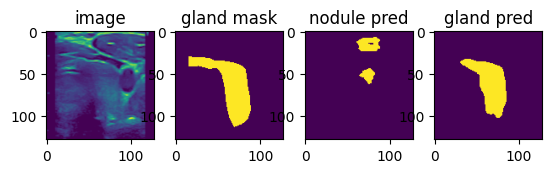

 10%|█         | 23/229 [00:04<00:40,  5.05it/s]

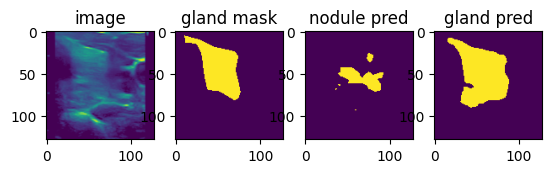

 19%|█▉        | 43/229 [00:12<00:53,  3.50it/s]

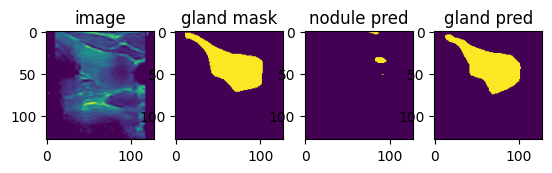

 19%|█▉        | 44/229 [00:12<00:53,  3.45it/s]

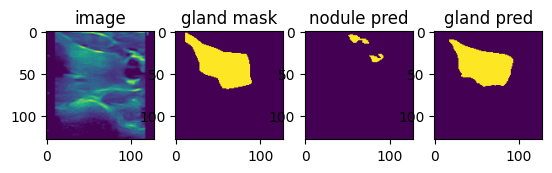

 21%|██        | 47/229 [00:14<01:22,  2.20it/s]

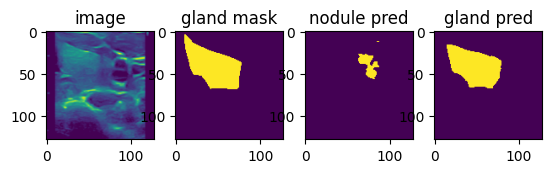

 22%|██▏       | 50/229 [00:14<00:51,  3.48it/s]

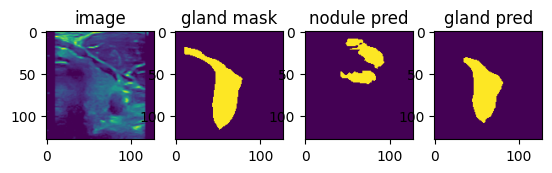

 22%|██▏       | 51/229 [00:15<00:51,  3.49it/s]

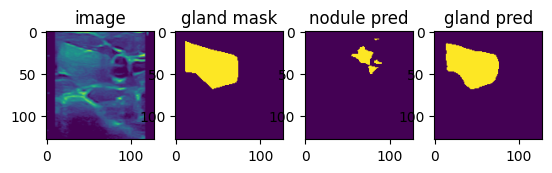

 25%|██▍       | 57/229 [00:15<00:31,  5.52it/s]

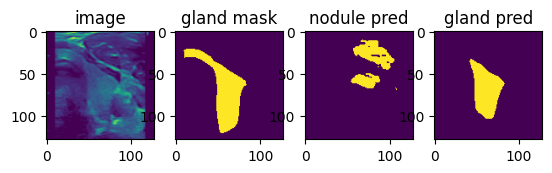

 29%|██▉       | 66/229 [00:20<01:30,  1.80it/s]

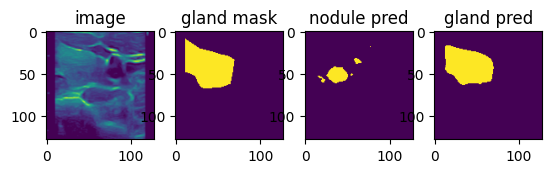

 29%|██▉       | 67/229 [00:20<01:19,  2.04it/s]

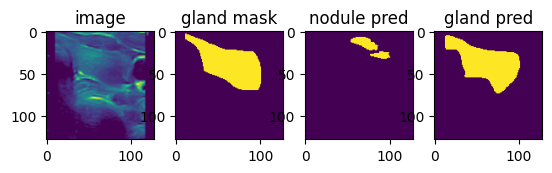

 34%|███▍      | 79/229 [00:23<00:26,  5.72it/s]

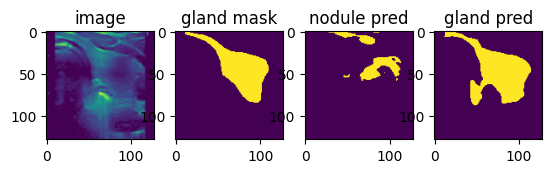

 36%|███▌      | 83/229 [00:23<00:21,  6.79it/s]

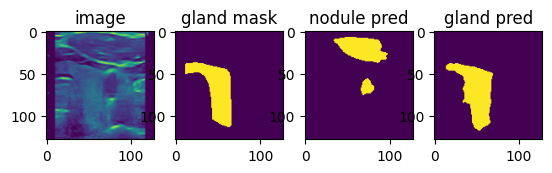

 37%|███▋      | 85/229 [00:24<00:27,  5.23it/s]

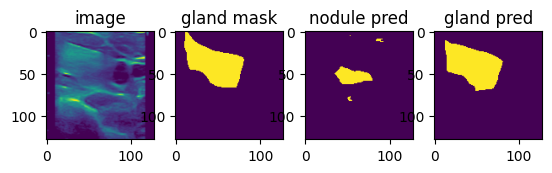

 38%|███▊      | 86/229 [00:24<00:29,  4.85it/s]

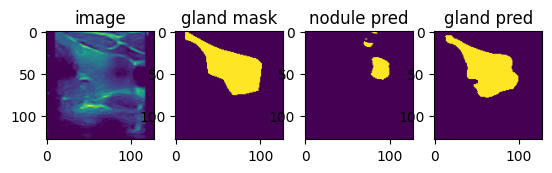

 38%|███▊      | 88/229 [00:24<00:27,  5.07it/s]

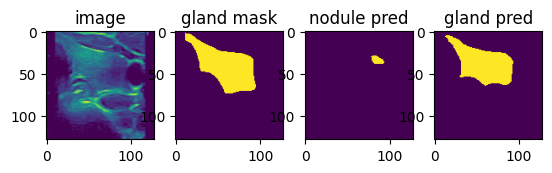

 40%|███▉      | 91/229 [00:25<00:41,  3.33it/s]

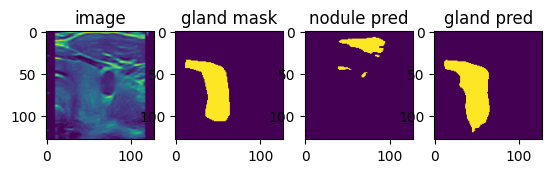

 41%|████      | 93/229 [00:26<00:34,  3.94it/s]

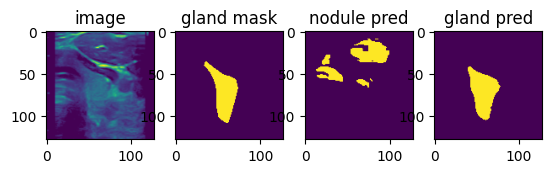

 41%|████▏     | 95/229 [00:26<00:37,  3.59it/s]

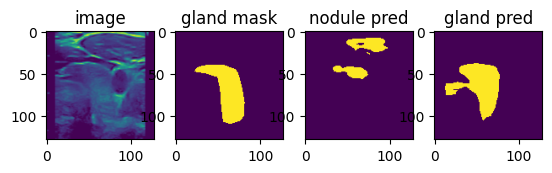

 42%|████▏     | 97/229 [00:28<01:12,  1.82it/s]

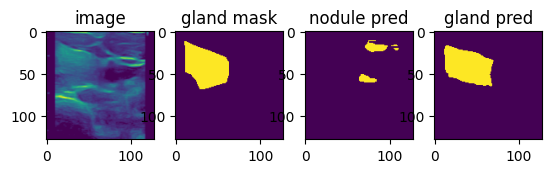

 43%|████▎     | 98/229 [00:29<01:10,  1.86it/s]

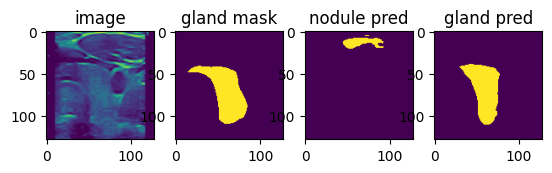

 45%|████▍     | 102/229 [00:29<00:32,  3.89it/s]

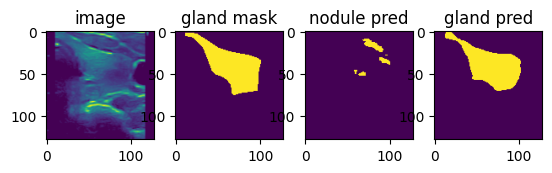

 45%|████▍     | 103/229 [00:29<00:33,  3.81it/s]

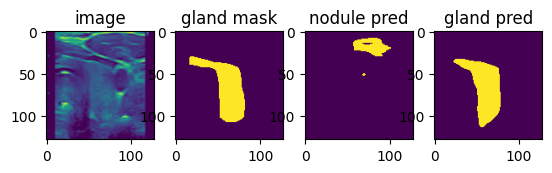

 46%|████▋     | 106/229 [00:30<00:23,  5.14it/s]

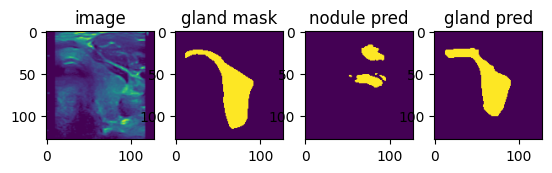

 50%|████▉     | 114/229 [00:32<00:22,  5.10it/s]

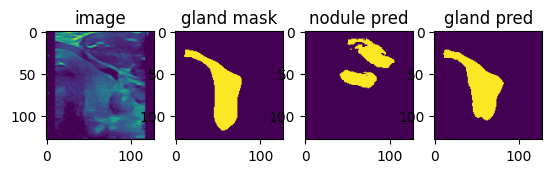

 51%|█████     | 117/229 [00:33<00:33,  3.37it/s]

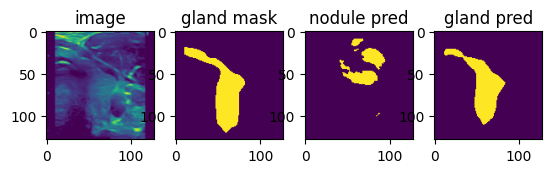

 52%|█████▏    | 120/229 [00:34<00:24,  4.49it/s]

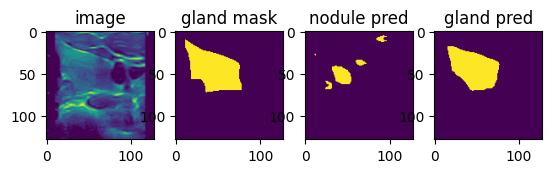

 53%|█████▎    | 121/229 [00:34<00:25,  4.31it/s]

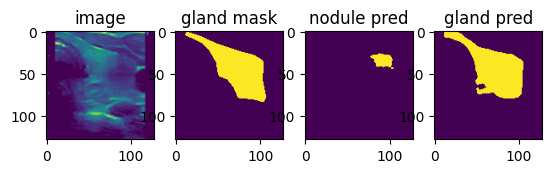

 53%|█████▎    | 122/229 [00:34<00:25,  4.14it/s]

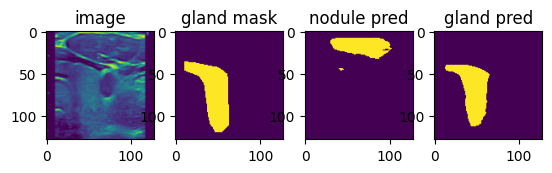

 54%|█████▍    | 124/229 [00:34<00:21,  4.78it/s]

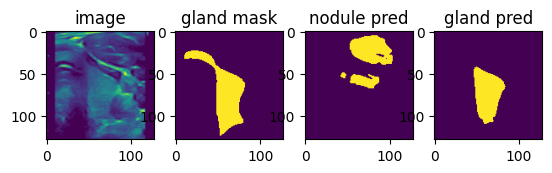

 55%|█████▌    | 127/229 [00:35<00:21,  4.83it/s]

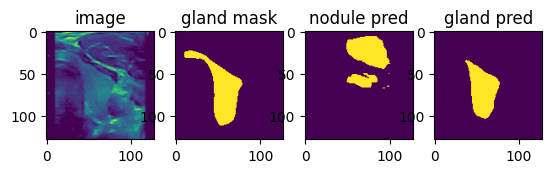

 56%|█████▌    | 128/229 [00:35<00:22,  4.48it/s]

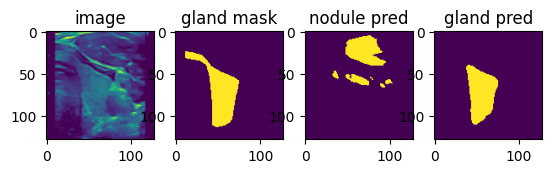

 56%|█████▋    | 129/229 [00:36<00:35,  2.83it/s]

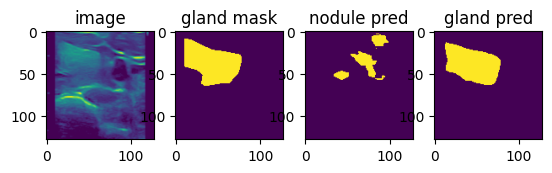

 57%|█████▋    | 130/229 [00:38<01:00,  1.63it/s]

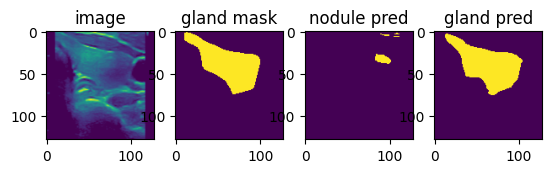

 57%|█████▋    | 131/229 [00:38<00:51,  1.90it/s]

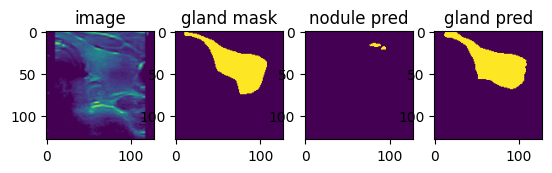

 59%|█████▉    | 135/229 [00:39<00:34,  2.71it/s]

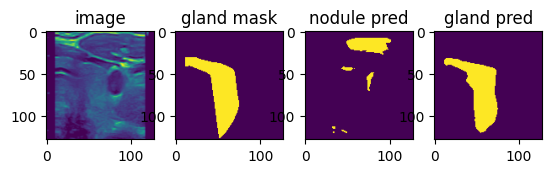

 62%|██████▏   | 141/229 [00:42<00:51,  1.72it/s]

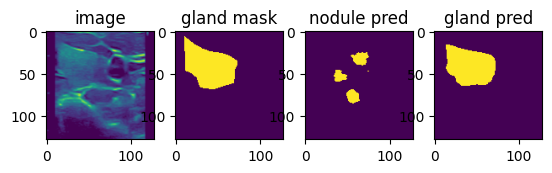

 62%|██████▏   | 143/229 [00:43<00:46,  1.87it/s]

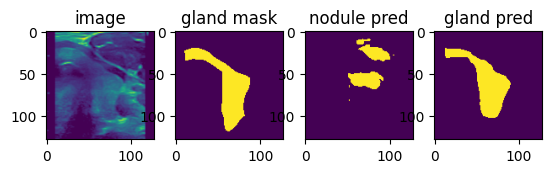

 64%|██████▍   | 147/229 [00:44<00:19,  4.11it/s]

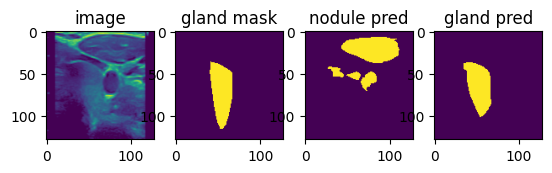

 67%|██████▋   | 154/229 [00:46<00:19,  3.93it/s]

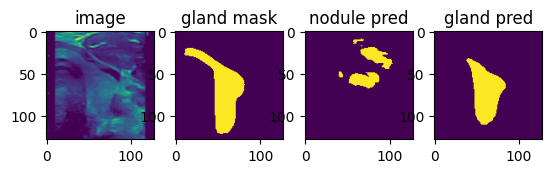

 68%|██████▊   | 156/229 [00:48<00:30,  2.36it/s]

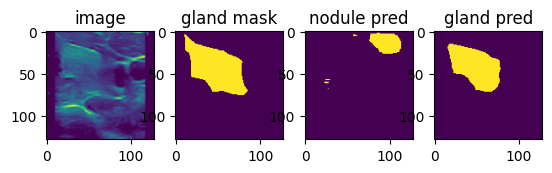

 72%|███████▏  | 166/229 [00:50<00:19,  3.21it/s]

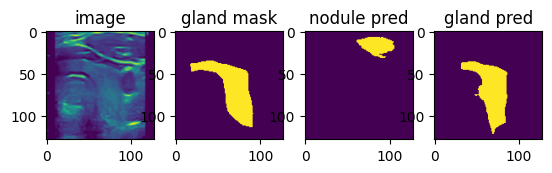

 75%|███████▌  | 172/229 [00:58<01:02,  1.09s/it]

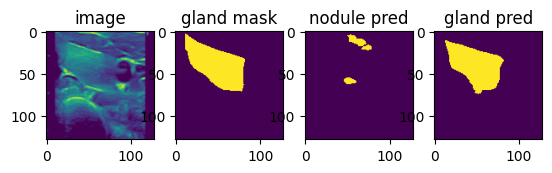

 76%|███████▋  | 175/229 [00:59<00:39,  1.37it/s]

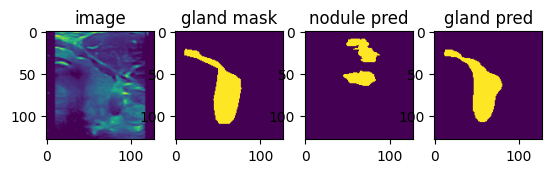

 78%|███████▊  | 178/229 [01:00<00:26,  1.93it/s]

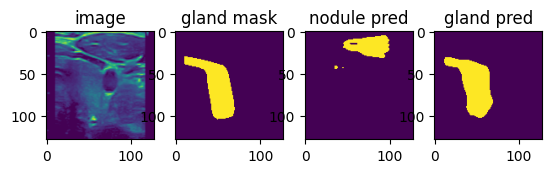

 78%|███████▊  | 179/229 [01:03<00:17,  2.84it/s]


KeyboardInterrupt: 

In [34]:
test_dataset = Ge_Benq_Dataset("../ge_benq_data/ge_benq_test_v2.csv", transform = test_augmentation, image_size = image_size, training = False, allow_zero_mask = False)
test_dataloader = DataLoader(test_dataset, batch_size = batch_size, shuffle = False, collate_fn=custom_collate_fn)
model.to("cpu")
for image, mask, from_dataset, mask_type in tqdm(test_dataloader):
    if image != None:
        outputs = model(image)
        if from_dataset[0] == 2 and mask_type[0]==2:
            nodule_output = outputs[:, 0:1, :, :]
            gland_output = outputs[:, 1:2, :, :]
            
            nodule_output = torch.sigmoid(nodule_output)
            nodule_output = nodule_output > 0.5

            gland_output = postprocess_logits_with_fill(gland_output)
            
            plt.subplot(1,4,1)
            plt.imshow(image[0][0])
            plt.title("image")
            plt.subplot(1,4,2)
            plt.imshow(mask[0][0])
            plt.title("gland mask")
            plt.subplot(1,4,3)
            plt.imshow(nodule_output[0][0].detach().numpy())
            plt.title("nodule pred")
            plt.subplot(1,4,4)
            plt.imshow(gland_output[0][0].detach().numpy())
            plt.title("gland pred")
            plt.show()

# visualize ge zero mask

In [38]:
# test_dataset = Ge_Benq_Dataset("../ge_benq_data/ge_benq_test.csv", transform = test_augmentation, image_size = image_size, training = False, allow_zero_mask = True)
# test_dataloader = DataLoader(test_dataset, batch_size = batch_size, shuffle = False, collate_fn=custom_collate_fn)
# model.to("cpu")
# for image, mask, from_dataset in tqdm(test_dataloader):
#     if torch.sum(mask) == 0:
#         outputs = model(image)
#         if from_dataset[0] == 1:
#             nodule_output = outputs[:, 0:1, :, :]
#             ge_output = nodule_output[from_dataset==1]
#             ge_output = torch.sigmoid(ge_output)
#             ge_output = ge_output > 0.5
#             ge_mask = mask[from_dataset==1]

#             plt.subplot(1,3,1)
#             plt.imshow(image[0][0])
#             plt.title("image")
#             plt.subplot(1,3,2)
#             plt.imshow(ge_mask[0][0])
#             plt.title("mask")
#             plt.subplot(1,3,3)
#             plt.imshow(ge_output[0][0].detach().numpy())
#             plt.title("pred")
#             plt.show()

# visualize benq zero mask

In [39]:
# test_dataset = Ge_Benq_Dataset("../ge_benq_data/ge_benq_test.csv", transform = test_augmentation, image_size = image_size, training = False, allow_zero_mask = True)
# test_dataloader = DataLoader(test_dataset, batch_size = batch_size, shuffle = False, collate_fn=custom_collate_fn)
# model.to("cpu")
# for image, mask, from_dataset in tqdm(test_dataloader):
#     if torch.sum(mask) == 0:
#         outputs = model(image)
#         if from_dataset[0] == 2:
#             gland_output = outputs[:, 1:2, :, :]
#             benq_output = gland_output[from_dataset==2]
#             benq_output = postprocess_logits_with_fill(benq_output)
#             # benq_output = torch.sigmoid(benq_output)
#             # benq_output = benq_output > 0.5
#             benq_mask = mask[from_dataset==2]

#             plt.subplot(1,3,1)
#             plt.imshow(image[0][0])
#             plt.title("image")
#             plt.subplot(1,3,2)
#             plt.imshow(benq_mask[0][0])
#             plt.title("mask")
#             plt.subplot(1,3,3)
#             plt.imshow(benq_output[0][0].detach().numpy())
#             plt.title("pred")
#             plt.show()

# visualize nodule post process

  0%|          | 0/191 [00:00<?, ?it/s]

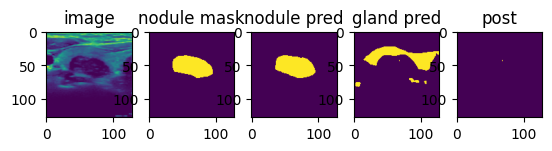

  3%|▎         | 5/191 [00:00<00:12, 15.00it/s]

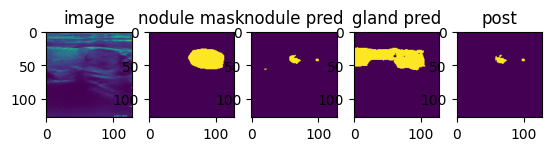

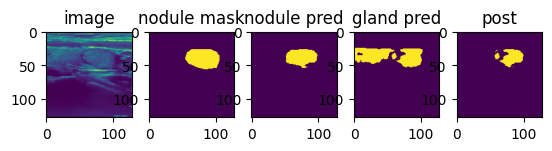

  4%|▍         | 8/191 [00:01<00:24,  7.61it/s]

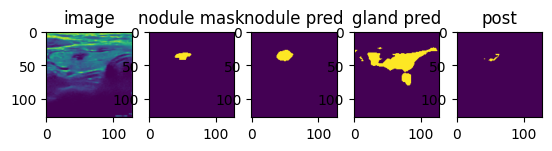

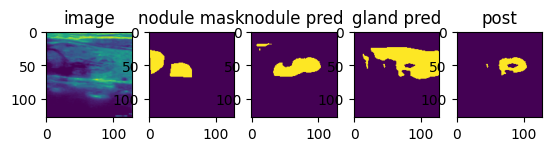

  7%|▋         | 13/191 [00:01<00:22,  8.03it/s]

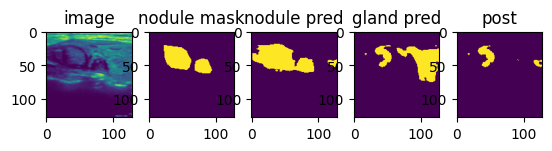

  8%|▊         | 15/191 [00:02<00:23,  7.39it/s]

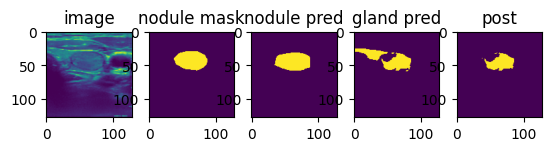

  9%|▉         | 17/191 [00:02<00:25,  6.94it/s]

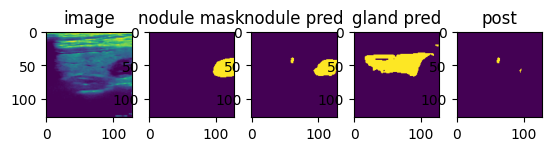

 10%|▉         | 19/191 [00:02<00:25,  6.86it/s]

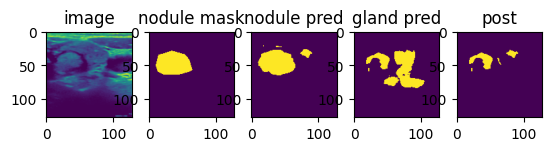

 10%|█         | 20/191 [00:02<00:29,  5.85it/s]

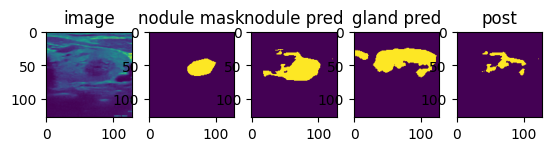

 11%|█         | 21/191 [00:03<00:33,  5.14it/s]

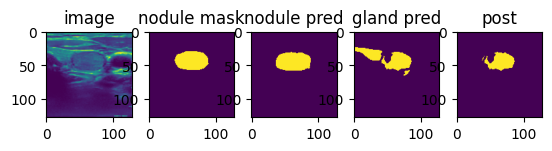

 12%|█▏        | 22/191 [00:03<00:36,  4.64it/s]

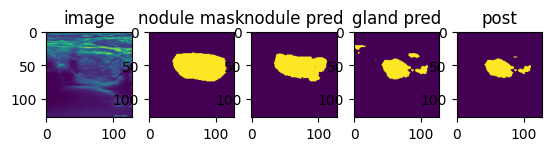

 13%|█▎        | 25/191 [00:03<00:28,  5.86it/s]

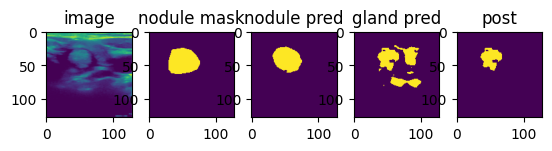

 14%|█▎        | 26/191 [00:04<00:31,  5.18it/s]

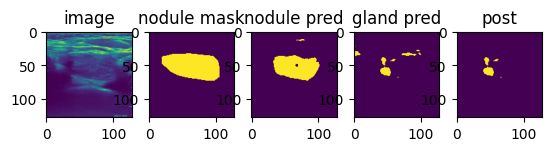

 14%|█▍        | 27/191 [00:04<00:35,  4.65it/s]

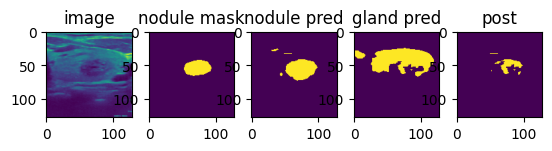

 16%|█▌        | 30/191 [00:04<00:27,  5.92it/s]

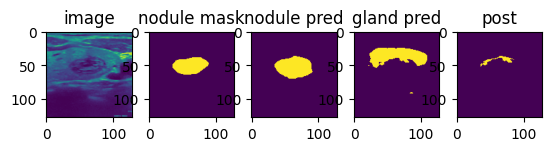

 16%|█▌        | 31/191 [00:05<00:30,  5.20it/s]

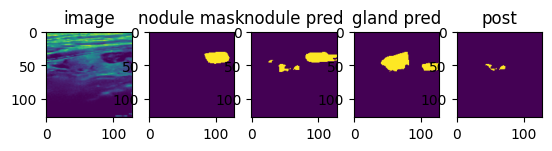

 20%|██        | 39/191 [00:05<00:13, 11.31it/s]

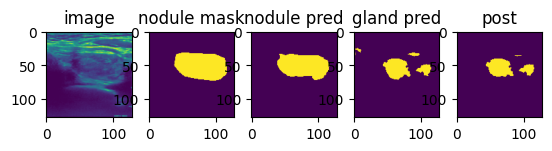

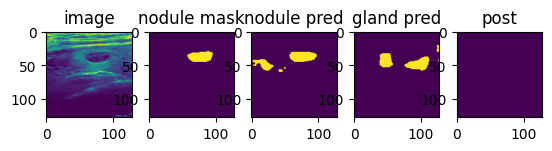

 21%|██▏       | 41/191 [00:06<00:20,  7.45it/s]

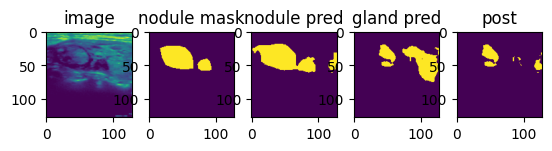

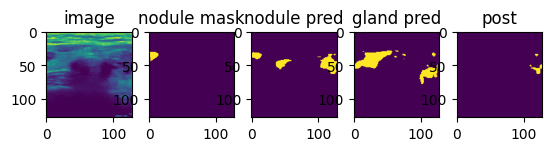

 23%|██▎       | 43/191 [00:07<00:33,  4.36it/s]

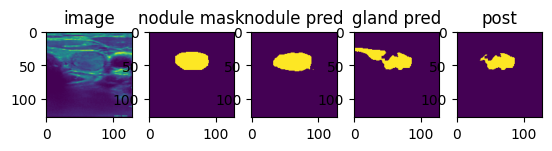

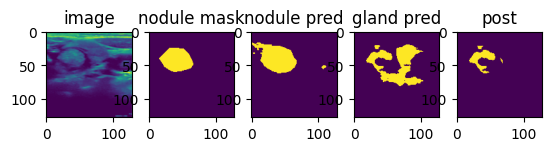

 24%|██▎       | 45/191 [00:07<00:35,  4.07it/s]

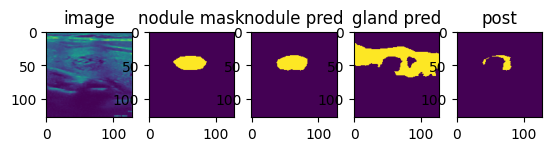

 24%|██▍       | 46/191 [00:08<00:36,  3.95it/s]

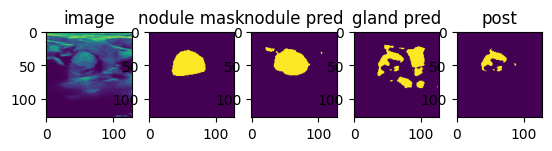

 26%|██▌       | 49/191 [00:08<00:28,  5.05it/s]

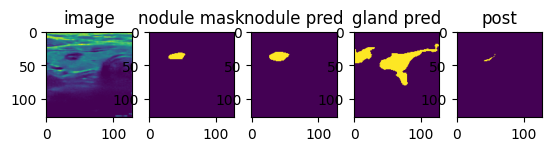

 26%|██▌       | 50/191 [00:08<00:30,  4.69it/s]

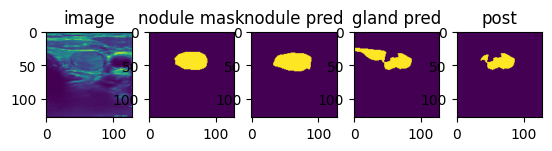

 27%|██▋       | 51/191 [00:09<00:31,  4.39it/s]

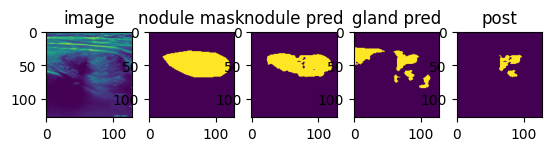

 28%|██▊       | 53/191 [00:09<00:28,  4.85it/s]

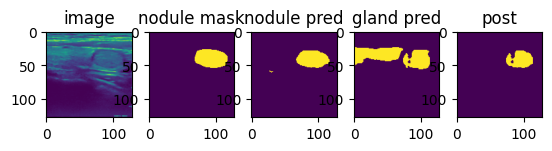

 28%|██▊       | 54/191 [00:09<00:30,  4.48it/s]

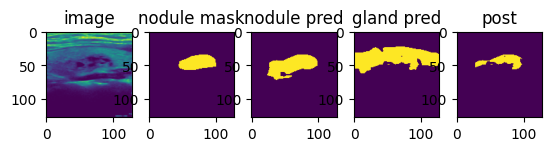

 29%|██▉       | 55/191 [00:09<00:32,  4.19it/s]

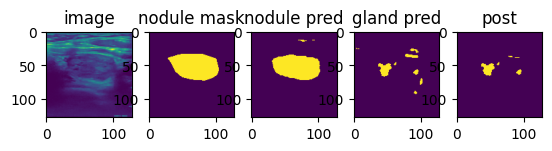

 30%|██▉       | 57/191 [00:10<00:28,  4.78it/s]

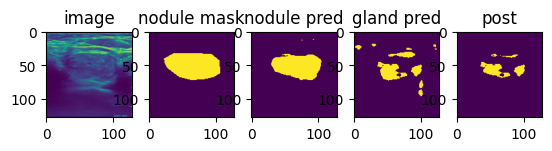

 32%|███▏      | 61/191 [00:10<00:17,  7.32it/s]

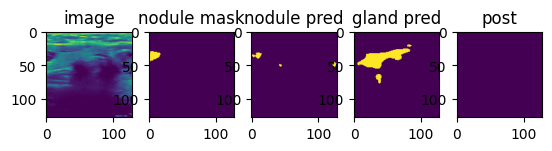

 33%|███▎      | 63/191 [00:10<00:17,  7.11it/s]

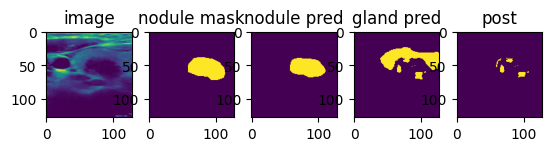

 34%|███▎      | 64/191 [00:11<00:21,  5.96it/s]

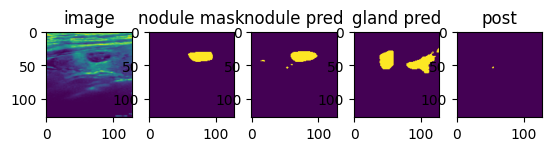

 34%|███▍      | 65/191 [00:11<00:24,  5.15it/s]

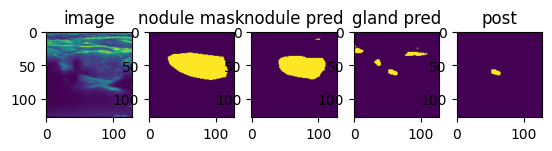

 36%|███▌      | 68/191 [00:11<00:18,  6.53it/s]

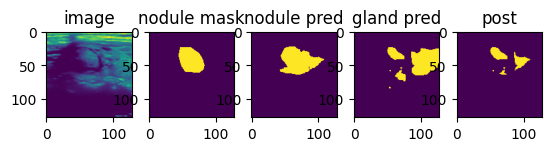

 39%|███▊      | 74/191 [00:12<00:11, 10.40it/s]

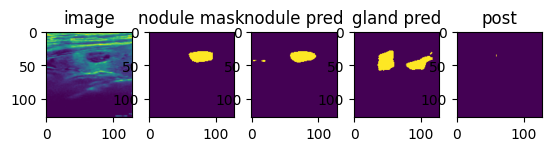

 40%|███▉      | 76/191 [00:12<00:12,  9.13it/s]

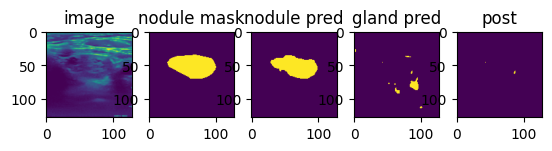

 41%|████      | 78/191 [00:12<00:14,  8.05it/s]

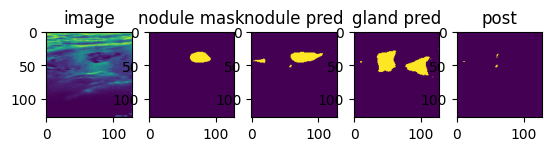

 42%|████▏     | 80/191 [00:13<00:15,  7.39it/s]

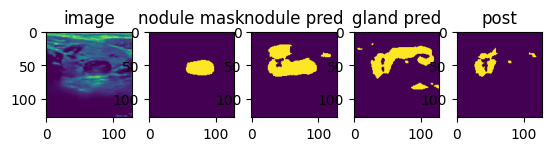

 42%|████▏     | 81/191 [00:14<00:25,  4.24it/s]

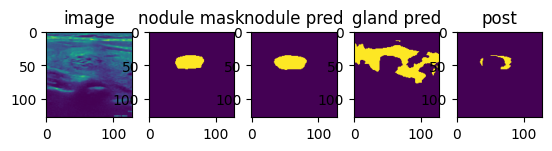

 44%|████▍     | 84/191 [00:14<00:20,  5.26it/s]

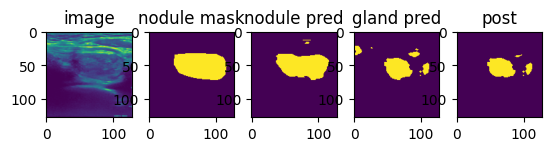

 46%|████▌     | 87/191 [00:14<00:17,  6.02it/s]

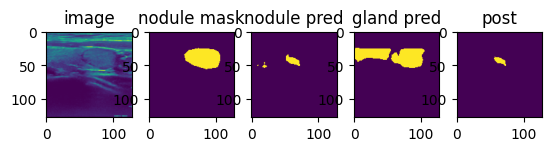

 46%|████▌     | 88/191 [00:15<00:19,  5.38it/s]

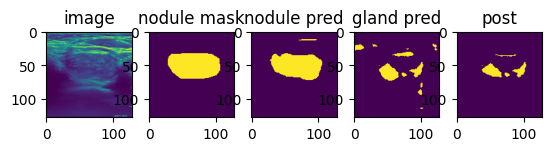

 47%|████▋     | 89/191 [00:15<00:20,  4.89it/s]

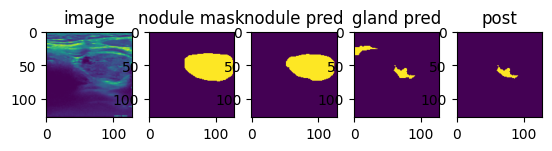

 49%|████▉     | 94/191 [00:15<00:11,  8.33it/s]

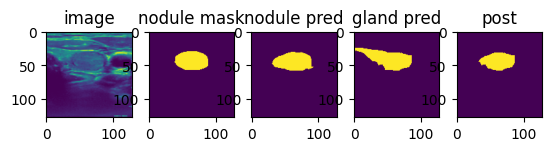

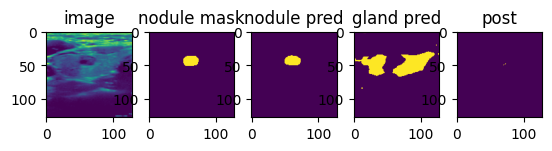

 50%|█████     | 96/191 [00:16<00:15,  5.94it/s]

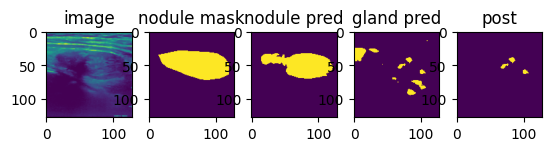

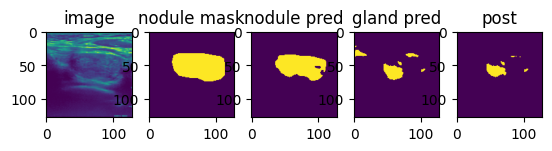

 51%|█████▏    | 98/191 [00:16<00:18,  4.91it/s]

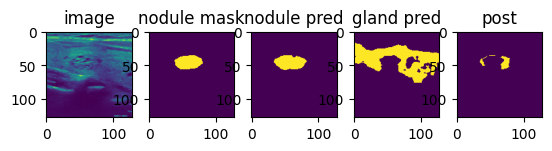

 52%|█████▏    | 100/191 [00:17<00:17,  5.31it/s]

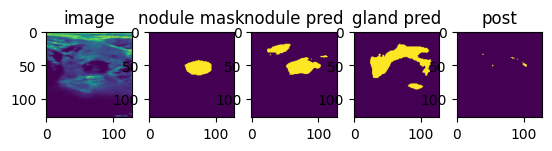

 55%|█████▍    | 105/191 [00:17<00:10,  8.27it/s]

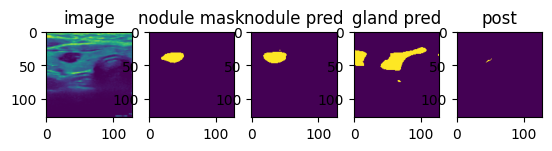

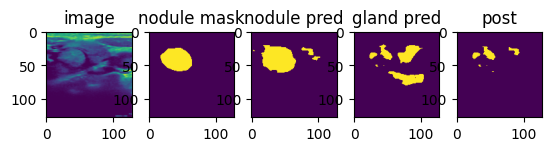

 56%|█████▌    | 107/191 [00:18<00:13,  6.03it/s]

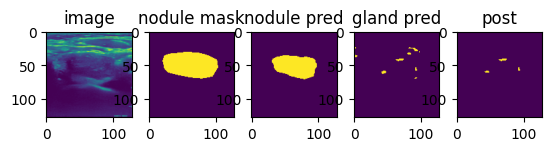

 57%|█████▋    | 109/191 [00:18<00:13,  6.19it/s]

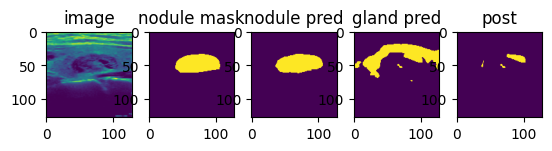

 58%|█████▊    | 110/191 [00:18<00:14,  5.47it/s]

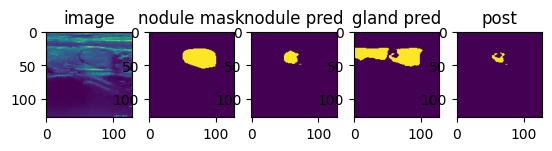

 59%|█████▉    | 113/191 [00:19<00:12,  6.33it/s]

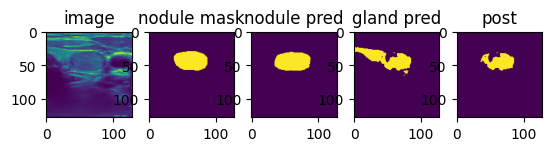

 60%|██████    | 115/191 [00:19<00:11,  6.35it/s]

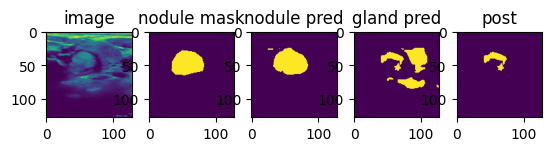

 61%|██████    | 116/191 [00:19<00:13,  5.57it/s]

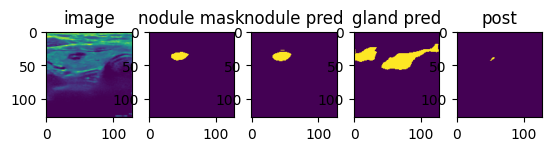

 61%|██████▏   | 117/191 [00:20<00:15,  4.87it/s]

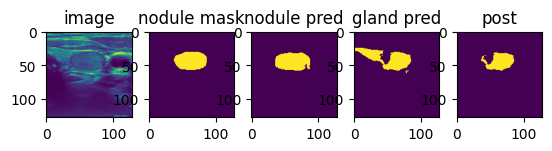

 62%|██████▏   | 119/191 [00:20<00:19,  3.75it/s]

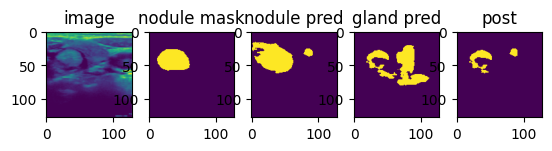

 65%|██████▍   | 124/191 [00:21<00:10,  6.56it/s]

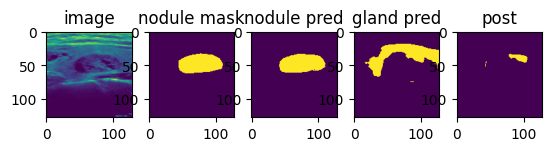

 66%|██████▌   | 126/191 [00:21<00:09,  6.59it/s]

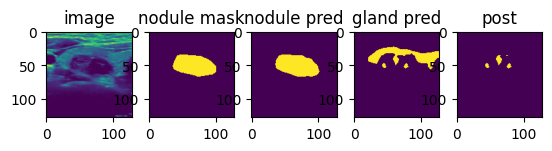

 66%|██████▋   | 127/191 [00:21<00:11,  5.70it/s]

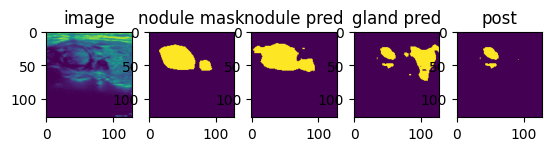

 68%|██████▊   | 130/191 [00:22<00:09,  6.53it/s]

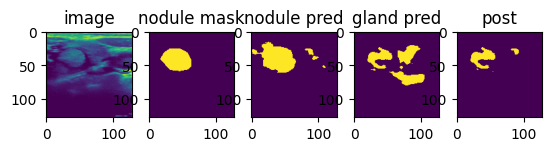

 70%|██████▉   | 133/191 [00:22<00:08,  7.03it/s]

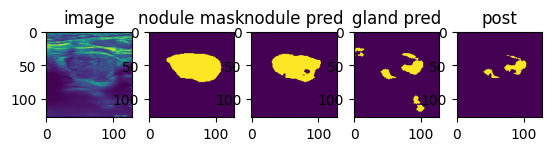

 70%|███████   | 134/191 [00:23<00:09,  6.05it/s]

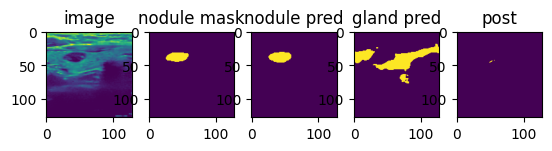

 71%|███████   | 135/191 [00:23<00:10,  5.32it/s]

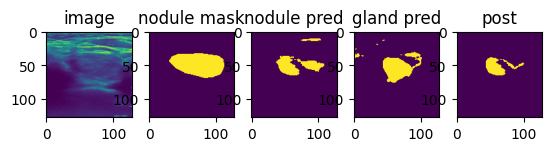

 71%|███████   | 136/191 [00:23<00:11,  4.78it/s]

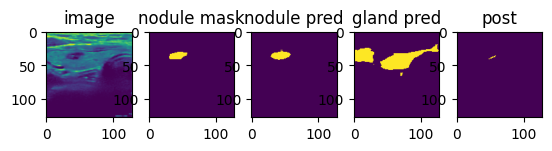

 72%|███████▏  | 137/191 [00:23<00:12,  4.39it/s]

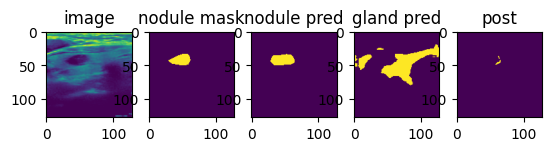

 72%|███████▏  | 138/191 [00:24<00:12,  4.10it/s]

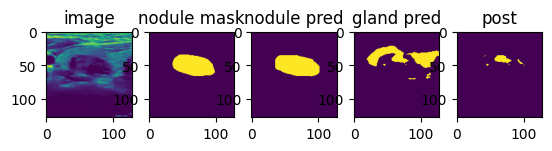

 74%|███████▍  | 142/191 [00:24<00:07,  6.48it/s]

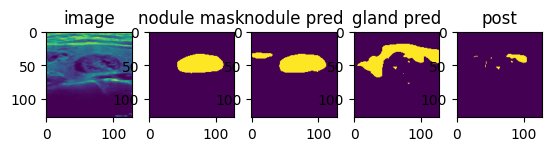

 75%|███████▍  | 143/191 [00:24<00:08,  5.61it/s]

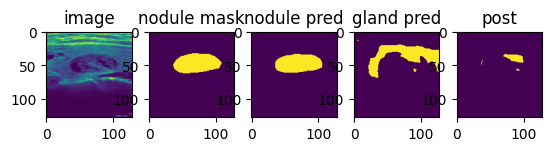

 76%|███████▋  | 146/191 [00:25<00:06,  6.64it/s]

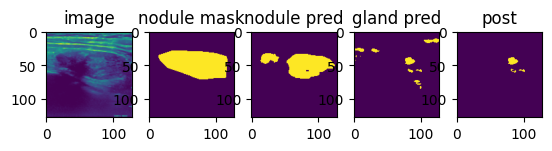

 77%|███████▋  | 147/191 [00:25<00:07,  5.72it/s]

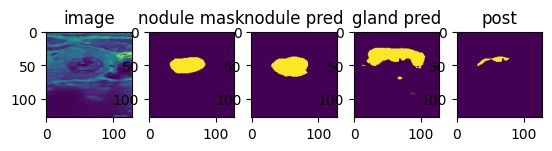

 77%|███████▋  | 148/191 [00:25<00:08,  5.02it/s]

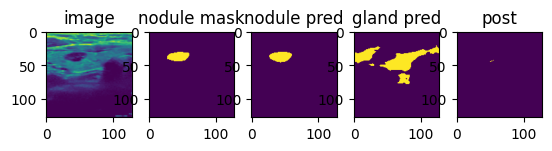

 78%|███████▊  | 149/191 [00:26<00:09,  4.54it/s]

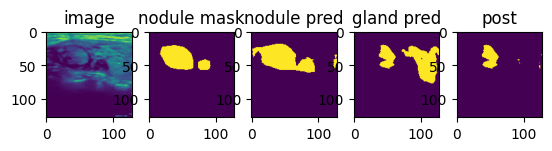

 79%|███████▉  | 151/191 [00:26<00:07,  5.01it/s]

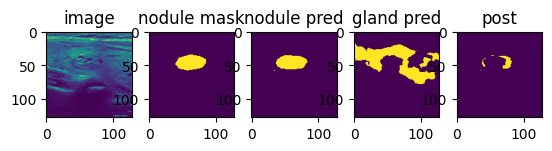

 80%|███████▉  | 152/191 [00:26<00:08,  4.55it/s]

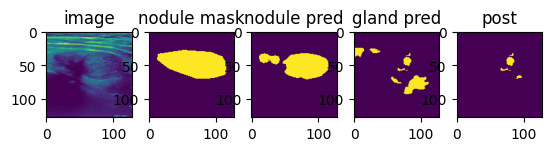

 80%|████████  | 153/191 [00:26<00:09,  4.20it/s]

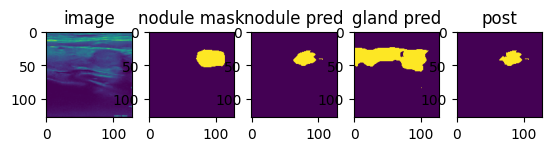

 81%|████████  | 154/191 [00:27<00:09,  3.96it/s]

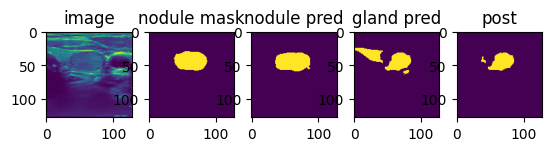

 82%|████████▏ | 157/191 [00:28<00:08,  3.91it/s]

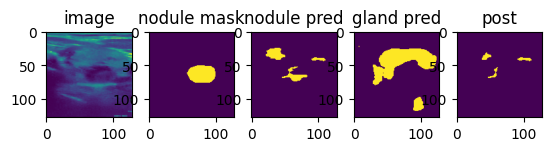

 84%|████████▍ | 160/191 [00:28<00:06,  5.00it/s]

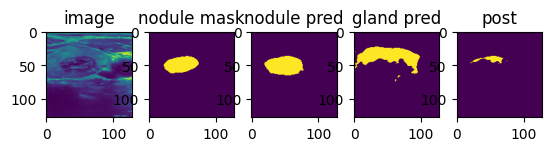

 85%|████████▍ | 162/191 [00:28<00:05,  5.26it/s]

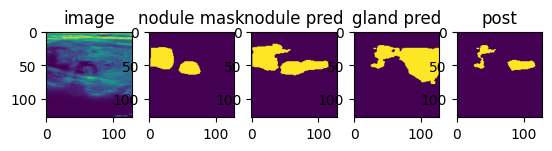

 85%|████████▌ | 163/191 [00:29<00:05,  4.81it/s]

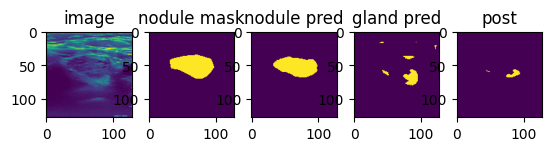

 86%|████████▌ | 164/191 [00:29<00:06,  4.45it/s]

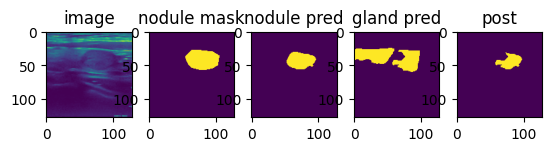

 87%|████████▋ | 166/191 [00:29<00:05,  4.92it/s]

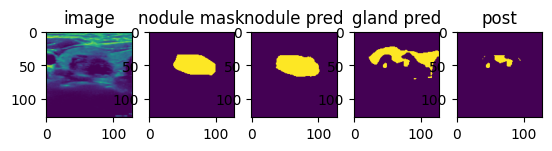

 90%|████████▉ | 171/191 [00:30<00:02,  7.84it/s]

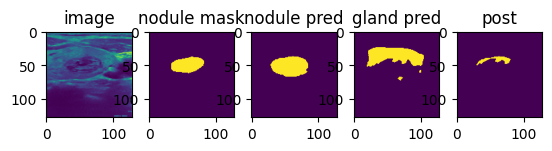

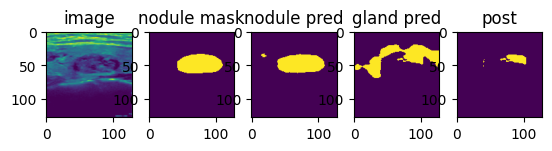

 91%|█████████ | 173/191 [00:30<00:03,  5.73it/s]

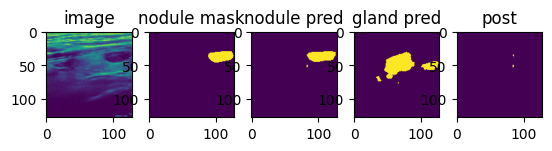

 91%|█████████ | 174/191 [00:31<00:03,  5.13it/s]

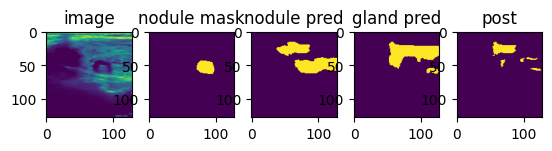

 92%|█████████▏| 175/191 [00:31<00:03,  4.67it/s]

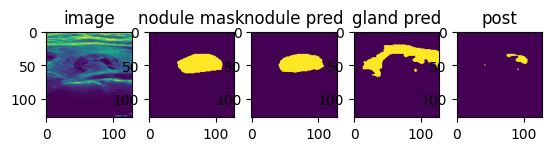

 92%|█████████▏| 176/191 [00:31<00:03,  4.31it/s]

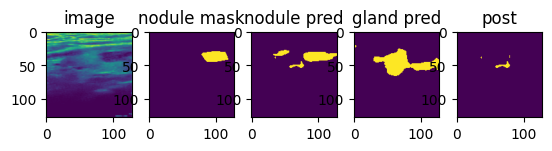

 93%|█████████▎| 177/191 [00:31<00:03,  4.04it/s]

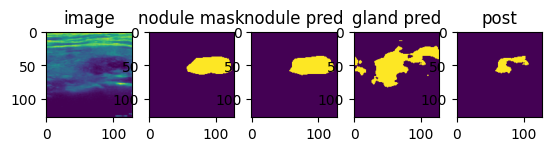

 94%|█████████▍| 180/191 [00:32<00:02,  5.39it/s]

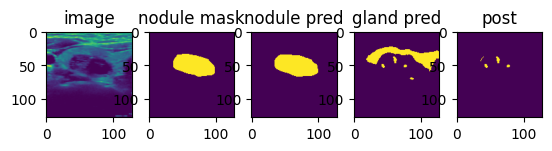

 95%|█████████▍| 181/191 [00:32<00:02,  4.86it/s]

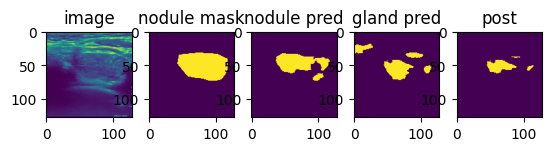

 96%|█████████▋| 184/191 [00:32<00:01,  6.10it/s]

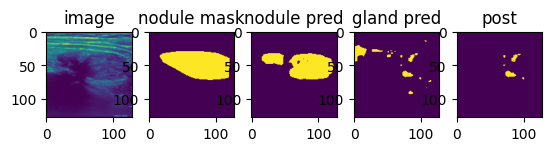

 97%|█████████▋| 185/191 [00:33<00:01,  4.98it/s]

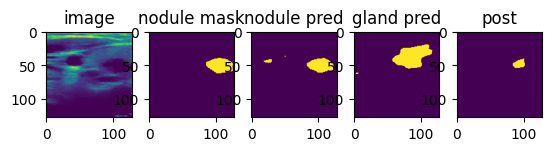

 98%|█████████▊| 187/191 [00:33<00:00,  5.28it/s]

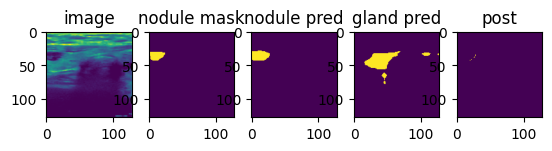

 98%|█████████▊| 188/191 [00:33<00:00,  4.78it/s]

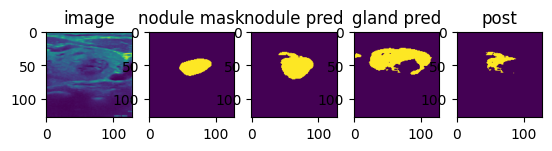

100%|██████████| 191/191 [00:34<00:00,  5.57it/s]


In [39]:
test_dataset = Ge_Benq_Dataset("../ge_benq_data/ge_benq_test.csv", transform = test_augmentation, image_size = image_size, training = False, allow_zero_mask = False)
test_dataloader = DataLoader(test_dataset, batch_size = batch_size, shuffle = False, collate_fn=custom_collate_fn)
model.to("cpu")
for image, mask, from_dataset in tqdm(test_dataloader):
    if image != None:
        outputs = model(image)
        if from_dataset[0] == 1:
            nodule_output = outputs[:, 0:1, :, :]
            gland_output = outputs[:, 1:2, :, :]

            
            nodule_output = nodule_output[from_dataset==1]
            nodule_output = torch.sigmoid(nodule_output)
            nodule_output = nodule_output > 0.5

            gland_output = gland_output[from_dataset==1]
            gland_output = torch.sigmoid(gland_output)
            gland_output = gland_output > 0.5

            nodule_post_process = nodule_output * gland_output

            
            nodule_mask = mask[from_dataset==1]

            plt.subplot(1,5,1)
            plt.imshow(image[0][0])
            plt.title("image")
            plt.subplot(1,5,2)
            plt.imshow(nodule_mask[0][0])
            plt.title("nodule mask")
            plt.subplot(1,5,3)
            plt.imshow(nodule_output[0][0].detach().numpy())
            plt.title("nodule pred")
            plt.subplot(1,5,4)
            plt.imshow(gland_output[0][0].detach().numpy())
            plt.title("gland pred")
            plt.subplot(1,5,5)
            plt.imshow(nodule_post_process[0][0].detach().numpy())
            plt.title("post")
            plt.show()